In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import geopandas as gpd
import geoplot as gplt
import matplotlib as mpl
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression



In [2]:
df=pd.read_csv('Downloads/Data_Project/dailyclimate.csv')

In [3]:
df.head()

,Index,Date,District,Latitude,Longitude,Precip,Pressure,Humidity_2m,RH_2m,Temp_2m,...,TempRange_2m,EarthSkinTemp,WindSpeed_10m,MaxWindSpeed_10m,MinWindSpeed_10m,WindSpeedRange_10m,WindSpeed_50m,MaxWindSpeed_50m,MinWindSpeed_50m,WindSpeedRange_50m
0,0,1981-01-01,Arghakhanchi,27.9,83.2,0.00,93.51,4.81,45.41,13.89,...,10.89,11.32,1.89,3.83,0.69,3.14,2.41,4.12,0.73,3.39
1,1,1981-01-02,Arghakhanchi,27.9,83.2,0.00,93.59,4.94,46.78,13.84,...,11.17,11.44,1.72,2.60,1.09,1.50,2.25,3.30,0.96,2.34
2,2,1981-01-03,Arghakhanchi,27.9,83.2,0.03,93.55,5.22,47.91,14.33,...,9.93,12.24,1.80,2.80,0.48,2.32,2.32,3.54,0.39,3.15
3,3,1981-01-04,Arghakhanchi,27.9,83.2,0.02,93.49,5.36,50.83,13.82,...,10.41,12.17,2.18,3.54,1.06,2.49,2.90,4.05,0.93,3.12
4,4,1981-01-05,Arghakhanchi,27.9,83.2,1.84,93.49,5.84,55.55,13.76,...,10.53,12.32,1.96,2.70,0.69,2.02,2.74,4.64,0.96,3.68


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 883128 entries, 0 to 883127
Data columns (total 23 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Index               883128 non-null  int64  
 1   Date                883128 non-null  object 
 2   District            883128 non-null  object 
 3   Latitude            883128 non-null  float64
 4   Longitude           883128 non-null  float64
 5   Precip              883128 non-null  float64
 6   Pressure            883128 non-null  float64
 7   Humidity_2m         883128 non-null  float64
 8   RH_2m               883128 non-null  float64
 9   Temp_2m             883128 non-null  float64
 10  WetBulbTemp_2m      883128 non-null  float64
 11  MaxTemp_2m          883128 non-null  float64
 12  MinTemp_2m          883128 non-null  float64
 13  TempRange_2m        883128 non-null  float64
 14  EarthSkinTemp       883128 non-null  float64
 15  WindSpeed_10m       883128 non-nul

In [5]:
df.describe()

,Index,Latitude,Longitude,Precip,Pressure,Humidity_2m,RH_2m,Temp_2m,WetBulbTemp_2m,MaxTemp_2m,...,TempRange_2m,EarthSkinTemp,WindSpeed_10m,MaxWindSpeed_10m,MinWindSpeed_10m,WindSpeedRange_10m,WindSpeed_50m,MaxWindSpeed_50m,MinWindSpeed_50m,WindSpeedRange_50m
count,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,...,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000,883128.000000
mean,441563.500000,27.959677,84.277419,2.433753,82.896390,8.491043,55.657950,15.815832,5.428265,21.856533,...,10.795352,15.539531,2.372512,4.673551,0.666903,4.006641,2.730587,4.643453,0.924084,3.719365
std,254937.238603,0.883261,2.181331,6.160721,10.707984,5.426636,22.877576,9.172463,10.850204,8.848121,...,3.306661,9.924091,0.685488,1.355903,0.510857,1.300380,1.001095,1.509792,0.806458,1.282227
min,0.000000,26.500000,80.200000,0.000000,54.730000,0.270000,4.040000,-25.440000,-28.190000,-16.940000,...,1.310000,-33.160000,0.470000,0.970000,0.000000,0.450000,0.650000,1.120000,0.000000,0.450000
25%,220781.750000,27.300000,82.400000,0.000000,77.680000,3.910000,36.540000,10.070000,-2.740000,16.550000,...,8.250000,9.160000,1.900000,3.730000,0.310000,3.070000,2.070000,3.610000,0.400000,2.830000
50%,441563.500000,27.950000,84.300000,0.050000,83.720000,6.750000,54.320000,16.730000,4.980000,22.510000,...,10.920000,16.530000,2.260000,4.520000,0.530000,3.910000,2.510000,4.340000,0.680000,3.520000
75%,662345.250000,28.500000,85.900000,1.870000,92.740000,13.170000,77.160000,22.500000,14.780000,27.940000,...,13.210000,22.880000,2.710000,5.450000,0.870000,4.840000,3.100000,5.310000,1.170000,4.390000
max,883127.000000,30.000000,87.900000,177.790000,100.340000,23.270000,100.000000,38.610000,27.150000,46.820000,...,25.520000,41.510000,13.570000,20.210000,8.360000,16.580000,15.710000,22.850000,10.940000,18.500000


In [6]:
shapefile_path = '/home/nush/Downloads/shapefiles/shape_files_of_districts_in_nepal.shp'
geo_data = gpd.read_file(shapefile_path)


In [7]:
geo_data.head()

,descriptio,name,objectid,dist_code,dist_name,shape_area,shape_len,cartodb_id,created_at,updated_at,geometry
0,None,None,1,56,Humla,0.563069,4.716705,1,2015-02-21,2015-02-21,"POLYGON ((81.39931 30.35919, 81.39867 30.36063..."
1,None,None,2,72,Darchula,0.218681,2.558935,2,2015-02-21,2015-02-21,"POLYGON ((81.09047 30.05482, 81.08816 30.0554,..."
2,None,None,3,69,Bajhang,0.324637,2.885682,3,2015-02-21,2015-02-21,"POLYGON ((81.09047 30.05482, 81.09086 30.05368..."
3,None,None,4,53,Mugu,0.300001,3.600518,4,2015-02-21,2015-02-21,"POLYGON ((82.49875 29.95082, 82.50055 29.94802..."
4,None,None,5,67,Bajura,0.212234,2.661084,5,2015-02-21,2015-02-21,"POLYGON ((81.50617 29.89602, 81.50912 29.89775..."


In [8]:
# Rename 'dist_name' to 'District' in the shapefile data
geo_data.rename(columns={'dist_name': 'District'}, inplace=True)

In [9]:
geo_data.head()

,descriptio,name,objectid,dist_code,District,shape_area,shape_len,cartodb_id,created_at,updated_at,geometry
0,None,None,1,56,Humla,0.563069,4.716705,1,2015-02-21,2015-02-21,"POLYGON ((81.39931 30.35919, 81.39867 30.36063..."
1,None,None,2,72,Darchula,0.218681,2.558935,2,2015-02-21,2015-02-21,"POLYGON ((81.09047 30.05482, 81.08816 30.0554,..."
2,None,None,3,69,Bajhang,0.324637,2.885682,3,2015-02-21,2015-02-21,"POLYGON ((81.09047 30.05482, 81.09086 30.05368..."
3,None,None,4,53,Mugu,0.300001,3.600518,4,2015-02-21,2015-02-21,"POLYGON ((82.49875 29.95082, 82.50055 29.94802..."
4,None,None,5,67,Bajura,0.212234,2.661084,5,2015-02-21,2015-02-21,"POLYGON ((81.50617 29.89602, 81.50912 29.89775..."


In [10]:
df.isnull().sum()

Index                 0
Date                  0
District              0
Latitude              0
Longitude             0
Precip                0
Pressure              0
Humidity_2m           0
RH_2m                 0
Temp_2m               0
WetBulbTemp_2m        0
MaxTemp_2m            0
MinTemp_2m            0
TempRange_2m          0
EarthSkinTemp         0
WindSpeed_10m         0
MaxWindSpeed_10m      0
MinWindSpeed_10m      0
WindSpeedRange_10m    0
WindSpeed_50m         0
MaxWindSpeed_50m      0
MinWindSpeed_50m      0
WindSpeedRange_50m    0
dtype: int64

In [11]:
df= df.drop(columns=['Index','WindSpeedRange_10m','WindSpeedRange_50m','TempRange_2m'])
df.columns

Index(['Date', 'District', 'Latitude', 'Longitude', 'Precip', 'Pressure',
       'Humidity_2m', 'RH_2m', 'Temp_2m', 'WetBulbTemp_2m', 'MaxTemp_2m',
       'MinTemp_2m', 'EarthSkinTemp', 'WindSpeed_10m', 'MaxWindSpeed_10m',
       'MinWindSpeed_10m', 'WindSpeed_50m', 'MaxWindSpeed_50m',
       'MinWindSpeed_50m'],
      dtype='object')

In [12]:
df.head()

,Date,District,Latitude,Longitude,Precip,Pressure,Humidity_2m,RH_2m,Temp_2m,WetBulbTemp_2m,MaxTemp_2m,MinTemp_2m,EarthSkinTemp,WindSpeed_10m,MaxWindSpeed_10m,MinWindSpeed_10m,WindSpeed_50m,MaxWindSpeed_50m,MinWindSpeed_50m
0,1981-01-01,Arghakhanchi,27.9,83.2,0.00,93.51,4.81,45.41,13.89,2.15,20.82,9.94,11.32,1.89,3.83,0.69,2.41,4.12,0.73
1,1981-01-02,Arghakhanchi,27.9,83.2,0.00,93.59,4.94,46.78,13.84,2.54,20.70,9.54,11.44,1.72,2.60,1.09,2.25,3.30,0.96
2,1981-01-03,Arghakhanchi,27.9,83.2,0.03,93.55,5.22,47.91,14.33,3.32,20.71,10.78,12.24,1.80,2.80,0.48,2.32,3.54,0.39
3,1981-01-04,Arghakhanchi,27.9,83.2,0.02,93.49,5.36,50.83,13.82,3.73,20.43,10.02,12.17,2.18,3.54,1.06,2.90,4.05,0.93
4,1981-01-05,Arghakhanchi,27.9,83.2,1.84,93.49,5.84,55.55,13.76,4.93,19.62,9.08,12.32,1.96,2.70,0.69,2.74,4.64,0.96


In [13]:
df['Date']=pd.to_datetime(df['Date'], errors='coerce')
df['Date'].head()

0   1981-01-01
1   1981-01-02
2   1981-01-03
3   1981-01-04
4   1981-01-05
Name: Date, dtype: datetime64[ns]

In [14]:
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df[['Date', 'Year', 'Month', 'Day']].head()  


,Date,Year,Month,Day
0,1981-01-01,1981,1,1
1,1981-01-02,1981,1,2
2,1981-01-03,1981,1,3
3,1981-01-04,1981,1,4
4,1981-01-05,1981,1,5


In [15]:
# Function to determine the season
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'

# Create a season column by applying the function to the month of the date
df['Season'] = df['Date'].dt.month.apply(get_season)
df[['Date', 'Season']].head() 

,Date,Season
0,1981-01-01,Winter
1,1981-01-02,Winter
2,1981-01-03,Winter
3,1981-01-04,Winter
4,1981-01-05,Winter


In [16]:
# Time series analysis
df.set_index('Date', inplace=True)
monthly_precip=df['Precip'].resample('ME').sum()
monthly_precip.head()



Date
1981-01-31    2599.03
1981-02-28     324.23
1981-03-31    1812.60
1981-04-30    2897.15
1981-05-31    7339.01
Freq: ME, Name: Precip, dtype: float64

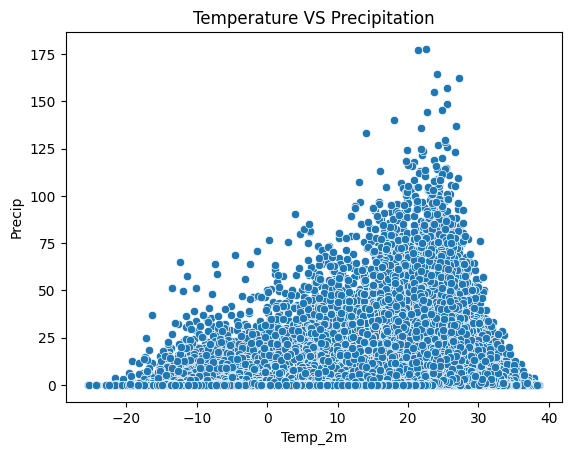

In [17]:
sns.scatterplot(x='Temp_2m',y='Precip',data=df)
plt.title('Temperature VS Precipitation')
plt.show()


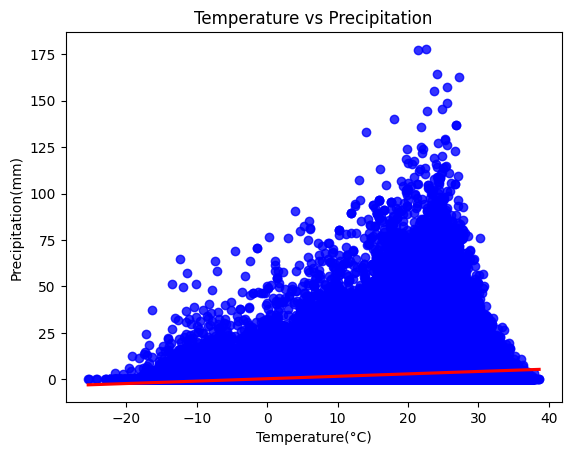

In [18]:
# Scatter plot with trend line using regplot
sns.regplot(x='Temp_2m', y='Precip', data=df, color='blue', line_kws={'color': 'red'})
plt.title('Temperature vs Precipitation')
plt.xlabel('Temperature(°C)')
plt.ylabel('Precipitation(mm)')
plt.show()


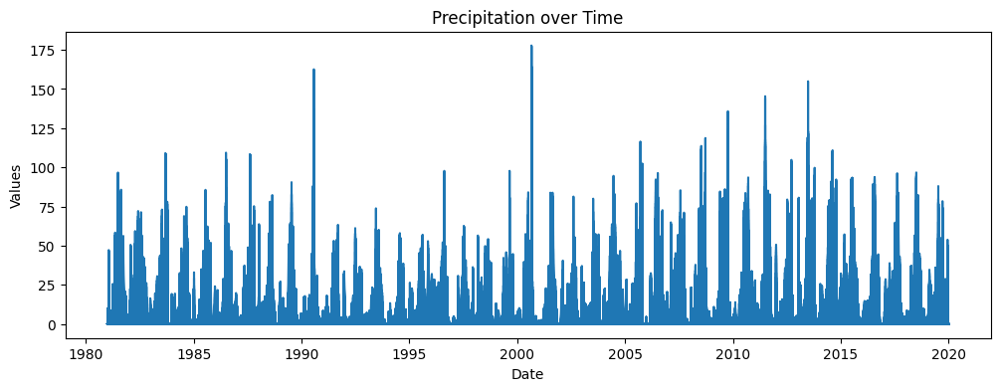

In [19]:
# Visualize change in precipitation over time
plt.figure(figsize=(12,4))
plt.plot(df['Precip'], label='Precipitation')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Precipitation over Time')
plt.show()



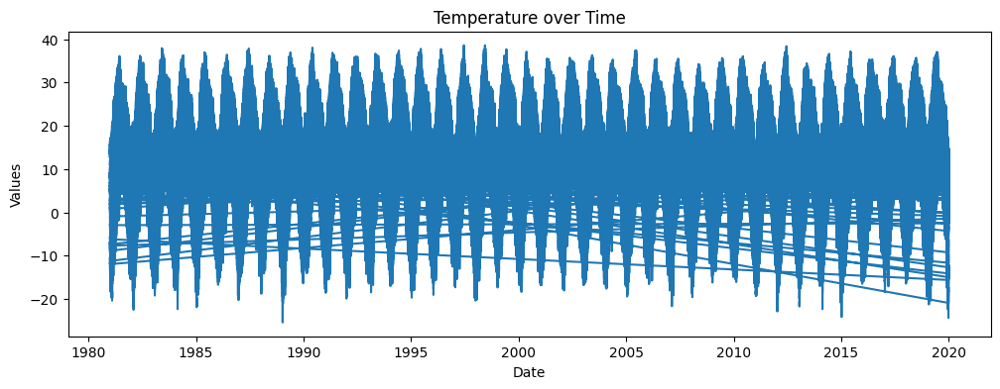

In [20]:
plt.figure(figsize=(12,4))
plt.plot(df['Temp_2m'], label='Temperature')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Temperature over Time')
plt.show()

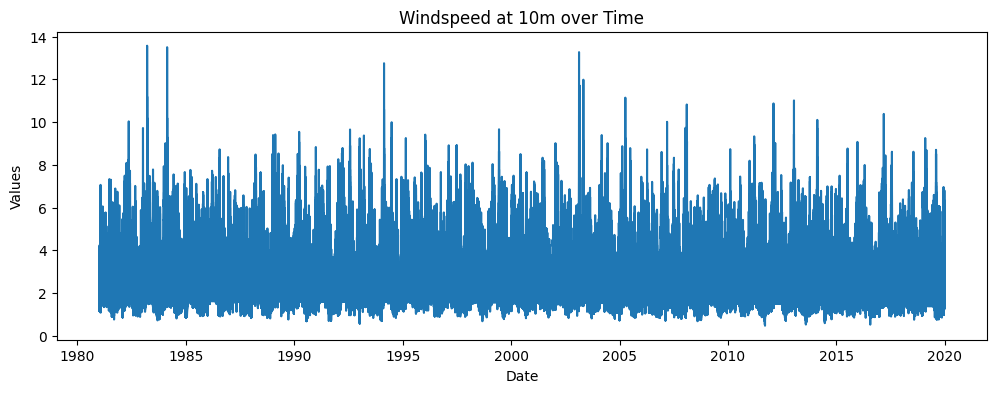

In [21]:
plt.figure(figsize=(12,4))
plt.plot(df['WindSpeed_10m'], label='Windspeed ')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Windspeed at 10m over Time')
plt.show()

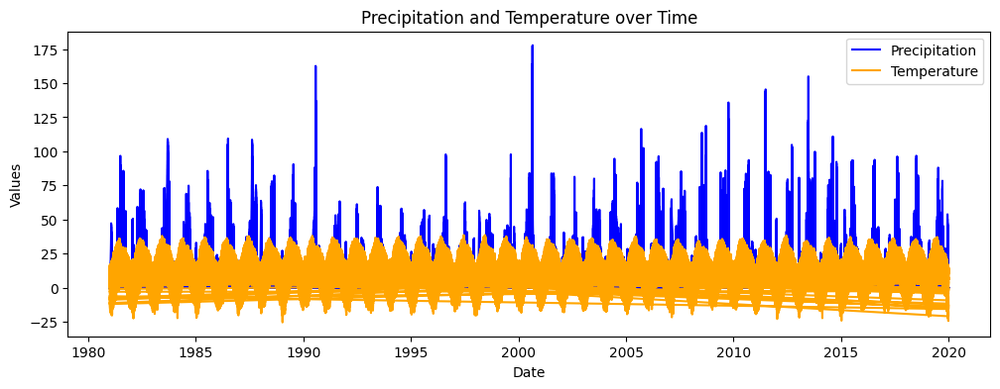

In [22]:
plt.figure(figsize=(12,4))
plt.plot(df['Precip'], label='Precipitation', color='blue')
plt.plot(df['Temp_2m'], label='Temperature', color='orange')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Precipitation and Temperature over Time')
plt.legend()
plt.show()

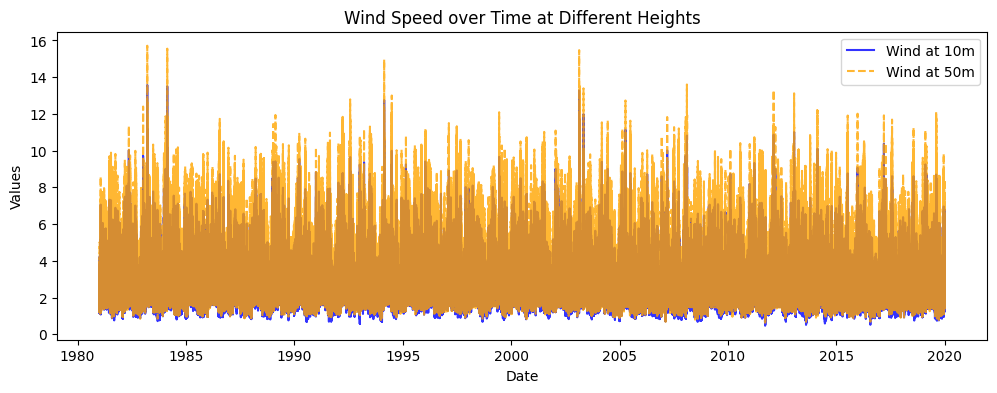

In [23]:
plt.figure(figsize=(12,4))
plt.plot(df['WindSpeed_10m'], label='Wind at 10m', color='blue', alpha=0.8, linestyle='-')
plt.plot(df['WindSpeed_50m'], label='Wind at 50m', color='orange', alpha=0.8,  linestyle='--')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Wind Speed over Time at Different Heights')
plt.legend()
plt.show()

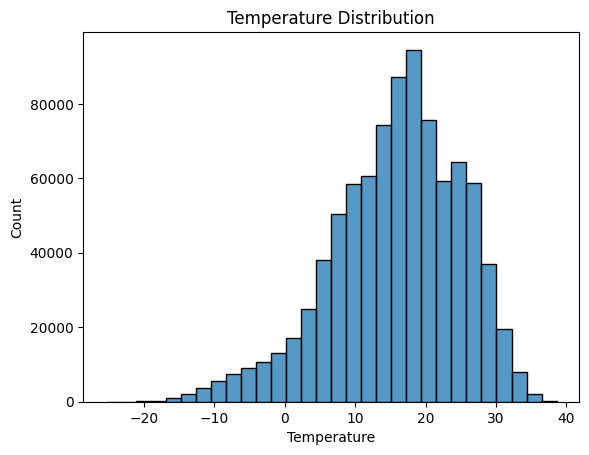

In [24]:
sns.histplot(df['Temp_2m'], bins=30)
plt.title('Temperature Distribution')
plt.xlabel('Temperature')
plt.show()

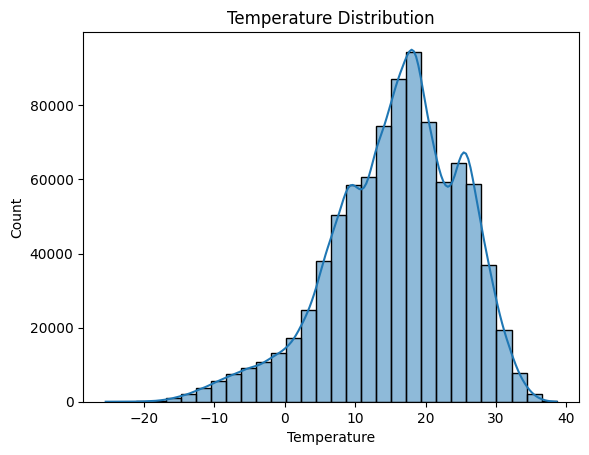

In [25]:
sns.histplot(df['Temp_2m'], bins=30, kde=True)
plt.title('Temperature Distribution')
plt.xlabel('Temperature')
plt.show()

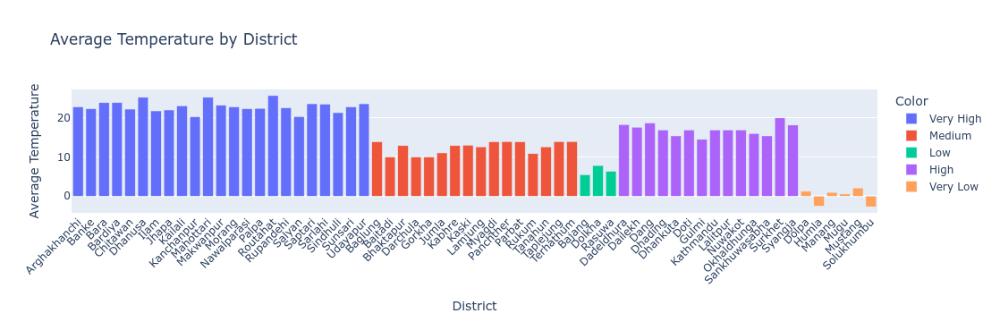

In [26]:
# Group and compute average temperatures
avg_temp_by_districts = df.groupby('District')['Temp_2m'].mean().reset_index()

# Create a color mapping based on temperature ranges or categories
avg_temp_by_districts['Color'] = pd.cut(avg_temp_by_districts['Temp_2m'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

# Create the bar chart
fig = px.bar(
    avg_temp_by_districts,
    x='District',
    y='Temp_2m',
    color='Color',  # Categorical color
    title='Average Temperature by District',
    labels={'Temp_2m': 'Average Temperature', 'District': 'District'},
    hover_data={'Temp_2m': ':.2f'}
)

fig.update_layout(xaxis_tickangle=-45)
fig.show()




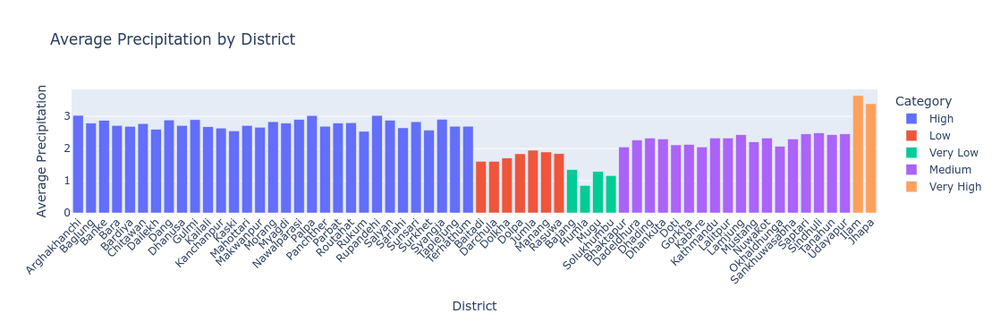

In [27]:
# Group and compute average precipitation
avg_precip_by_districts = df.groupby('District')['Precip'].mean().reset_index()

# Create a color mapping based on precipitation ranges
avg_precip_by_districts['Category'] = pd.cut(avg_precip_by_districts['Precip'], bins=5, labels=['Very Low', 'Low', 'Medium', 'High', 'Very High'])

# Create the bar chart with categorical color
fig = px.bar(
    avg_precip_by_districts,
    x='District',
    y='Precip',
    color='Category',  # Categorical color
    title='Average Precipitation by District',
    labels={'Precip': 'Average Precipitation', 'District': 'District'},
    hover_data={'Precip': ':.2f'}
)

fig.update_layout(xaxis_tickangle=-45)
fig.show()


In [28]:
avg_windspeed_by_districts= df.groupby('District')['WindSpeed_10m'].mean().reset_index()
avg_windspeed_by_districts['Category']=pd.cut(avg_windspeed_by_districts['WindSpeed_10m'],bins=5,labels=['Very Low','Low','Medium', 'High','Very High'])
fig= px.bar(
    avg_windspeed_by_districts,
    x='District',
    y='WindSpeed_10m',
    color='Category',
    title='Average Windspeed by District',
    labels={'WindSpeed_10m':'Average Windspeed','District':'District'},
    hover_data={'WindSpeed_10m':':.2f'}
)
fig.update_layout(xaxis_tickangle=-45)
fig.show()


<Figure size 1000x500 with 0 Axes>

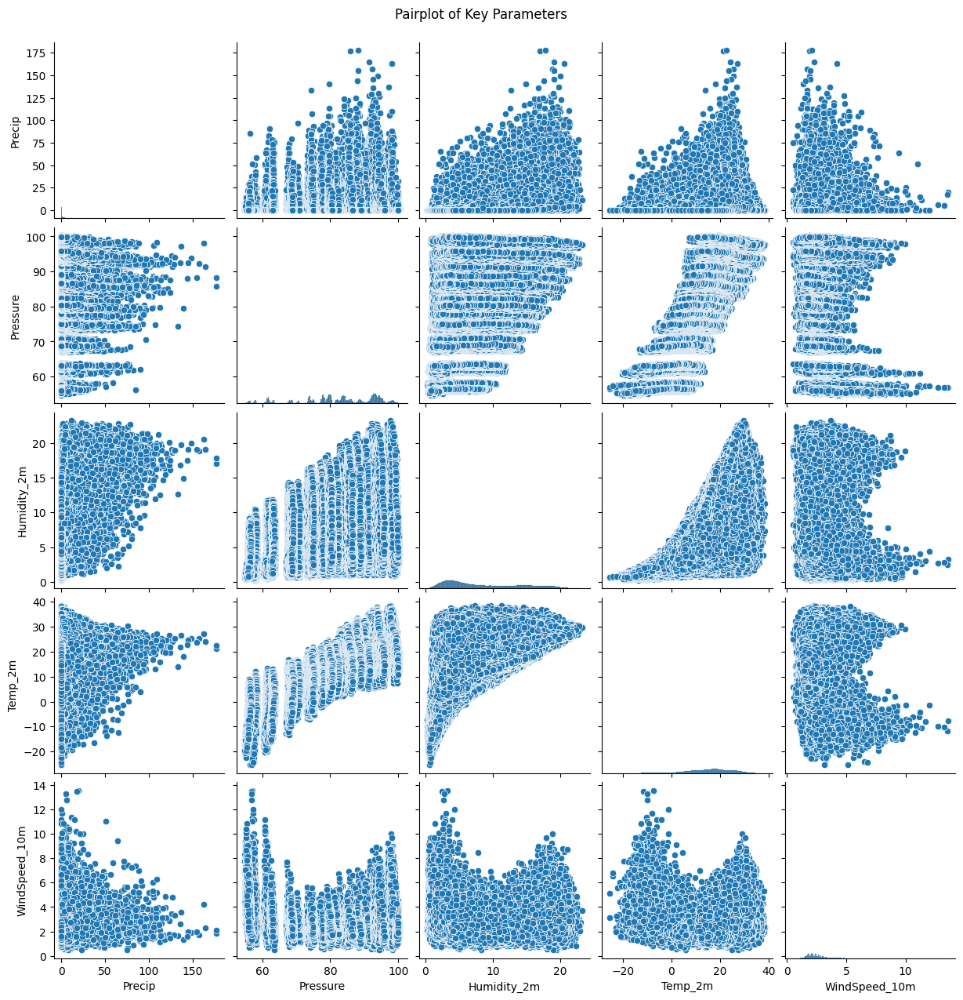

In [29]:
plt.figure(figsize=(10, 5))
key_parameters = ['Precip', 'Pressure', 'Humidity_2m', 'Temp_2m', 'WindSpeed_10m']
sns.pairplot(df[key_parameters])
plt.suptitle('Pairplot of Key Parameters', y=1.02)
plt.show()

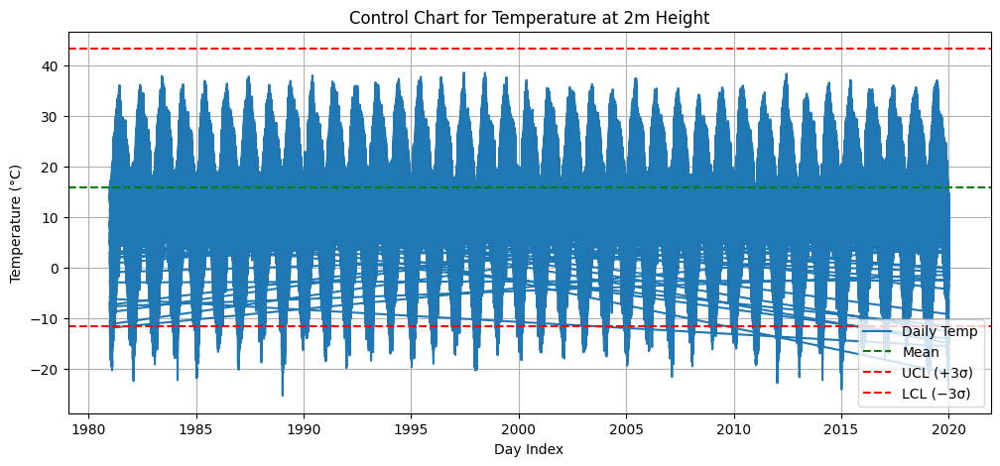

In [30]:

mean = df['Temp_2m'].mean()
std = df['Temp_2m'].std()

plt.figure(figsize=(12, 5))
plt.plot(df['Temp_2m'], label='Daily Temp')
plt.axhline(mean, color='green', linestyle='--', label='Mean')
plt.axhline(mean + 3*std, color='red', linestyle='--', label='UCL (+3σ)')
plt.axhline(mean - 3*std, color='red', linestyle='--', label='LCL (−3σ)')
plt.title('Control Chart for Temperature at 2m Height')
plt.xlabel('Day Index')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.show()


In [31]:
# KPI: Extreme heat days
extreme_days = df[df['Temp_2m'] > 35]
extreme_percent = (len(extreme_days) / len(df)) * 100
print(f"Extreme Heat Days: {extreme_percent:.2f}%")


Extreme Heat Days: 0.13%


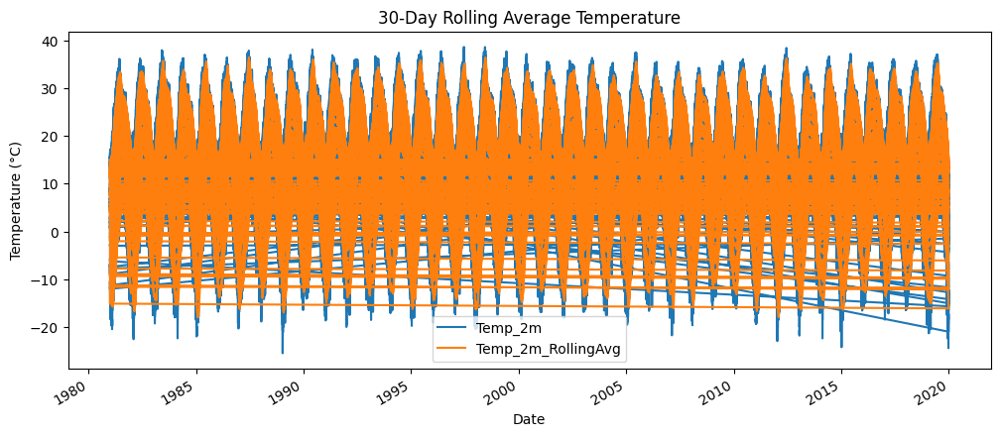

In [32]:
# KPI: Rolling average of temperature (30 days)
df['Temp_2m_RollingAvg'] = df['Temp_2m'].rolling(window=30).mean()
df[['Temp_2m', 'Temp_2m_RollingAvg']].plot(figsize=(12, 5), title='30-Day Rolling Average Temperature')
plt.ylabel('Temperature (°C)')
plt.show()


Text(0, 0.5, 'Temperature (°C)')

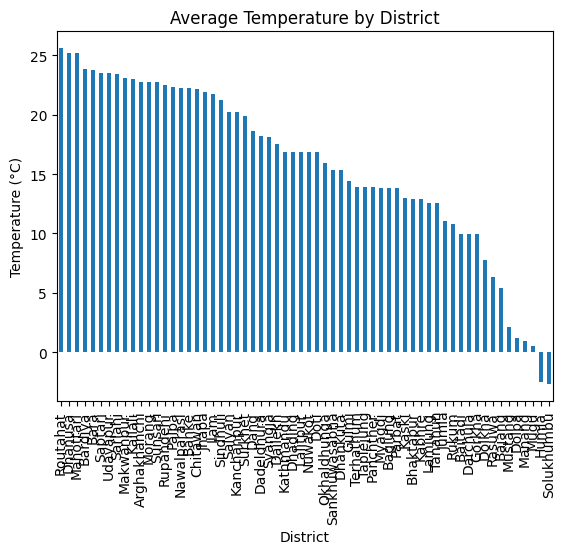

In [33]:
heat_df = df.groupby('District')['Temp_2m'].mean().sort_values(ascending=False)
heat_df.plot(kind='bar', title='Average Temperature by District')
plt.ylabel('Temperature (°C)')


In [34]:
district_counts = df['District'].value_counts()
print("Data points per district:")
print(district_counts)


Data points per district:
District
Arghakhanchi    14244
Baglung         14244
Baitadi         14244
Bajang          14244
Banke           14244
                ...  
Syangja         14244
Tanahun         14244
Taplejung       14244
Terhathum       14244
Udayapur        14244
Name: count, Length: 62, dtype: int64


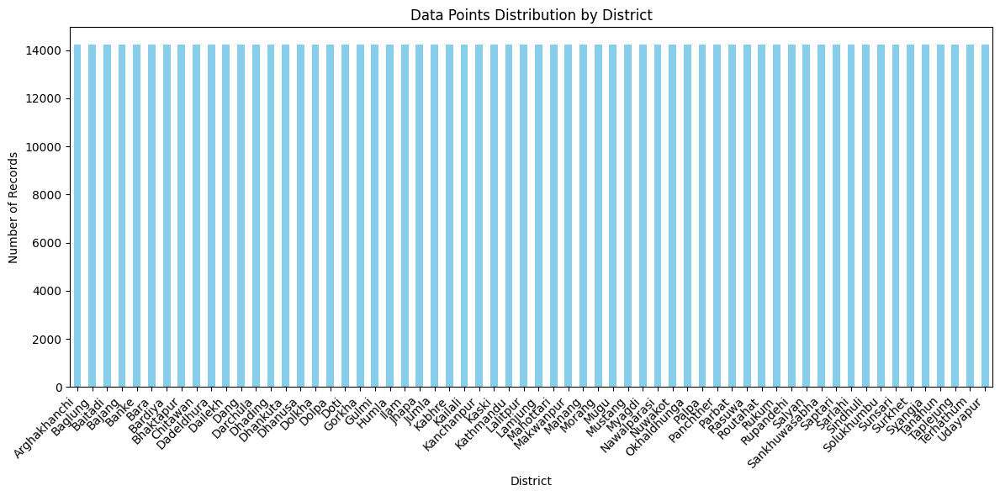

In [35]:
plt.figure(figsize=(12,6))
district_counts.plot(kind='bar', color='skyblue')
plt.title('Data Points Distribution by District')
plt.xlabel('District')
plt.ylabel('Number of Records')
plt.xticks(rotation=45, ha='right')  
plt.tight_layout() 
plt.show()


Records per Month:
Month
1     74958
2     68262
3     74958
4     72540
5     74958
6     72540
7     74958
8     74958
9     72540
10    74958
11    72540
12    74958
Name: count, dtype: int64


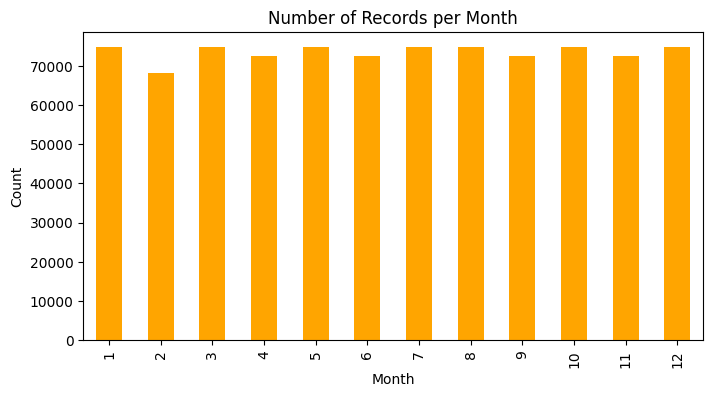

In [36]:

month_counts = df['Month'].value_counts().sort_index()
print("Records per Month:")
print(month_counts)

# Plot monthly distribution
plt.figure(figsize=(8,4))
month_counts.plot(kind='bar', color='orange')
plt.title('Number of Records per Month')
plt.xlabel('Month')
plt.ylabel('Count')
plt.show()

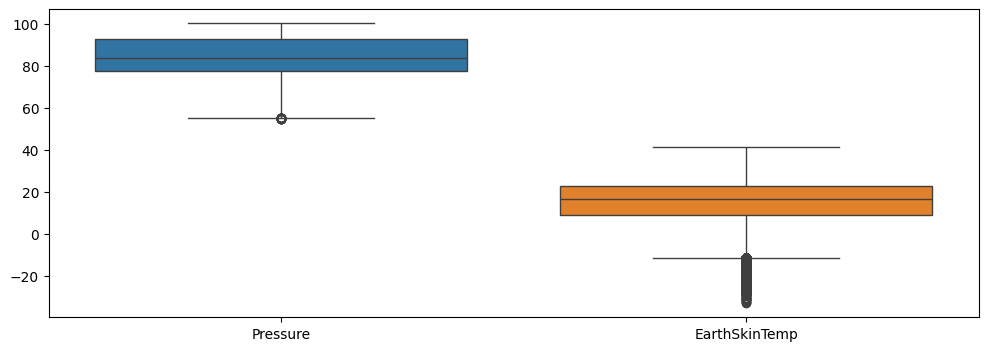

In [37]:
plt.figure(figsize=(12,4))
sns.boxplot(data=df[['Pressure', 'EarthSkinTemp']])
plt.show()

In [38]:
Q1_pres = df['Pressure'].quantile(0.25)
Q3_pres = df['Pressure'].quantile(0.75)
IQR_pres = Q3_pres - Q1_pres
lower_bound_pres = Q1_pres - 1.5 * IQR_pres
upper_bound_pres = Q3_pres + 1.5 * IQR_pres


In [39]:
filtered_data= df[(df['Pressure'] >= lower_bound_pres) & (df['Pressure'] <= upper_bound_pres)]


In [40]:
Q1_earth = df['EarthSkinTemp'].quantile(0.25)
Q3_earth = df['EarthSkinTemp'].quantile(0.75)
IQR_earth = Q3_earth - Q1_earth
lower_bound_earth = Q1_earth - 1.5 * IQR_earth
upper_bound_earth = Q3_earth + 1.5 * IQR_earth


In [41]:
filtered_data_earth = df[(df['EarthSkinTemp'] >= lower_bound_earth) & (df['EarthSkinTemp'] <= upper_bound_earth)]


In [42]:
filtered_data_combined = filtered_data[(filtered_data['Pressure'] >= lower_bound_pres) & (filtered_data['Pressure'] <= upper_bound_pres)]
filtered_data_combined = filtered_data_combined[(filtered_data_combined['EarthSkinTemp'] >= 
                                                 lower_bound_earth) & (filtered_data_combined['EarthSkinTemp'] <= upper_bound_earth)]


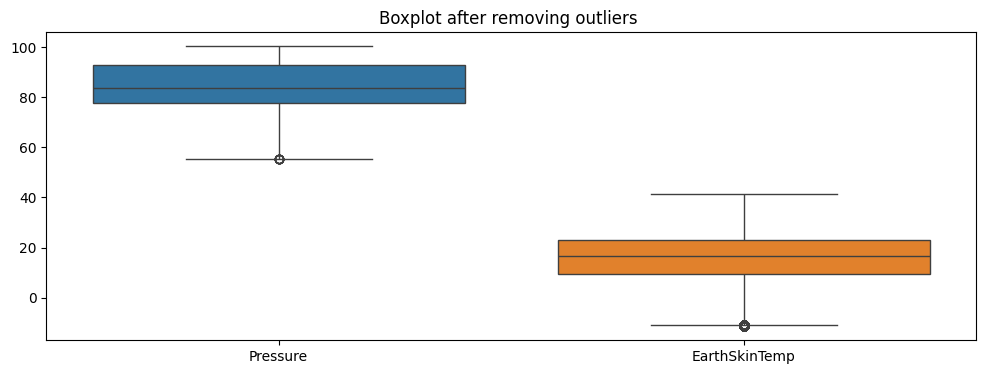

In [43]:
plt.figure(figsize=(12,4))
sns.boxplot(data= filtered_data_combined [['Pressure', 'EarthSkinTemp']])
plt.title('Boxplot after removing outliers ')           
plt.show()

In [44]:
#def remove_outliers_iqr(df, column):
   # Q1 = df[column].quantile(0.25)
    #Q3 = df[column].quantile(0.75)
    #IQR = Q3 - Q1
    
    #lower_bound = Q1 - 1.5 * IQR
    #upper_bound = Q3 + 1.5 * IQR
    
    #df_filtered = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    #return df_filtered

In [45]:
#df = remove_outliers_iqr(df, 'Temp_2m')
#df = remove_outliers_iqr(df, 'Humidity_2m')
#df = remove_outliers_iqr(df, 'Precip')
#df = remove_outliers_iqr(df, 'RH_2m')
#df = remove_outliers_iqr(df, 'WetBulbTemp_2m')
#df = remove_outliers_iqr(df, 'WindSpeed_10m')
#df = remove_outliers_iqr(df, 'WindSpeed_50m')


In [46]:
selected_df = df[['Pressure', 'EarthSkinTemp', 'WindSpeed_10m']]
correlation_matrix = selected_df.corr()
correlation_matrix

,Pressure,EarthSkinTemp,WindSpeed_10m
Pressure,1.000000,0.692269,-0.117280
EarthSkinTemp,0.692269,1.000000,0.126664
WindSpeed_10m,-0.117280,0.126664,1.000000


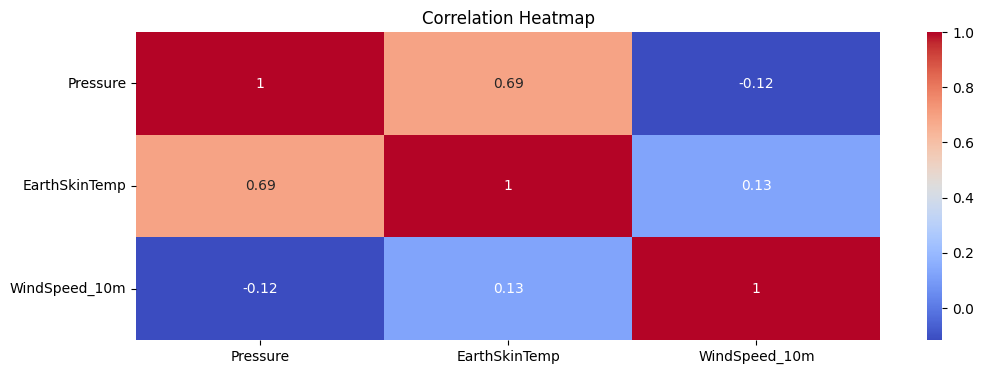

In [47]:
plt.figure(figsize=(12,4))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

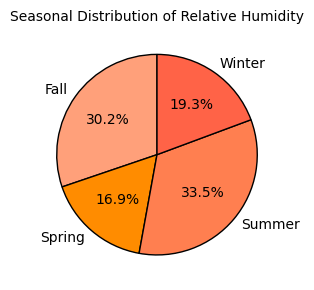

In [48]:
seasonal_rh = df.groupby('Season')['RH_2m'].mean()
colors = ['#FFA07A', '#FF8C00', '#FF7F50', '#FF6347']  
plt.figure(figsize=(5, 3))
plt.pie(
    seasonal_rh, 
    labels=seasonal_rh.index, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors, 
    wedgeprops={'edgecolor': 'black'}
)
plt.title('Seasonal Distribution of Relative Humidity', fontsize=10)
plt.tight_layout()
plt.show()


In [49]:
import plotly.express as px

# Group by season and compute average relative humidity
seasonal_rh = df.groupby('Season')['RH_2m'].mean().reset_index()

# Create a doughnut chart
fig = px.pie(
    seasonal_rh,
    names='Season',
    values='RH_2m',
    hole=0.5,  # This makes it a doughnut
    color_discrete_sequence=['#FFA07A', '#FF8C00', '#FF7F50', '#FF6347']
)

fig.update_traces(textinfo='percent+label')
fig.update_layout(
    title_text='Seasonal Distribution of Relative Humidity (Doughnut Chart)',
    title_font_size=14
)
fig.show()


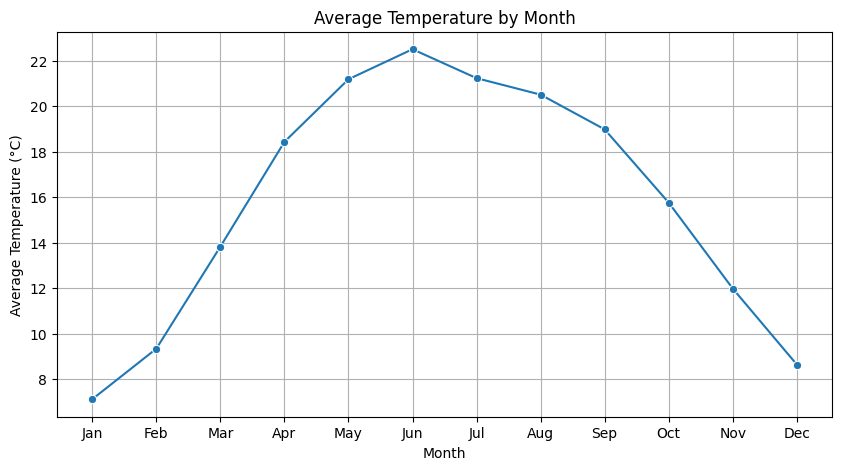

In [50]:
monthly_avg_temp = df.groupby('Month')['Temp_2m'].mean()

# Create a line plot
plt.figure(figsize=(10, 5))
sns.lineplot(x=monthly_avg_temp.index, y=monthly_avg_temp.values, marker='o')
plt.title('Average Temperature by Month')
plt.xlabel('Month')
plt.ylabel('Average Temperature (°C)')
plt.xticks(monthly_avg_temp.index, ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid()
plt.show()


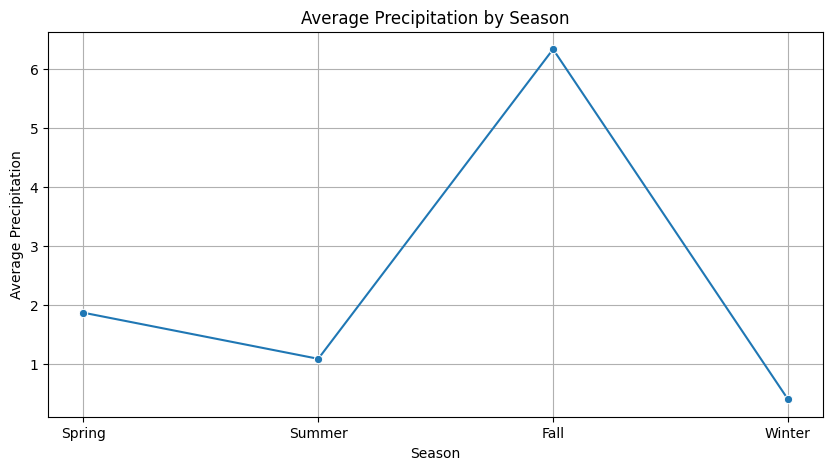

In [51]:
seasonal_avg_precip = df.groupby('Season')['Precip'].mean()

# Create a line plot
plt.figure(figsize=(10, 5))
sns.lineplot(x=seasonal_avg_precip.index, y=seasonal_avg_precip.values, marker='o')
plt.title('Average Precipitation by Season')
plt.xlabel('Season')
plt.ylabel('Average Precipitation')
plt.xticks(seasonal_avg_precip.index, ['Spring','Summer','Fall','Winter'])
plt.grid()
plt.show()

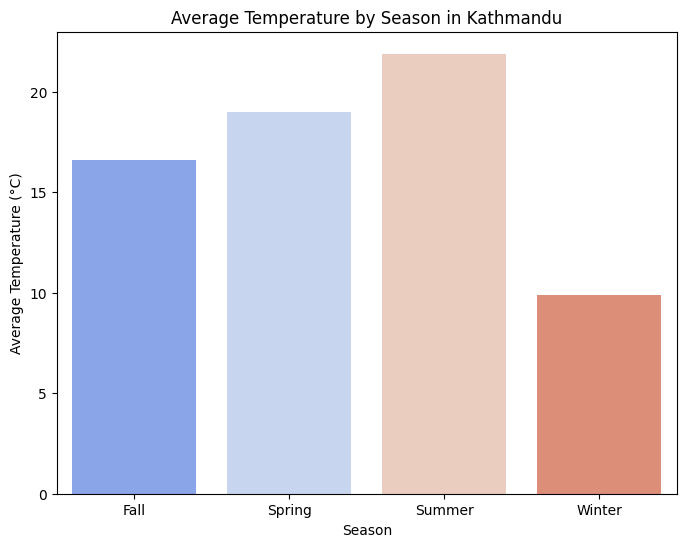

In [52]:
seasonal_data = df.groupby(['District', 'Season'])['Temp_2m'].mean().reset_index()
kathmandu_data = seasonal_data[seasonal_data['District'] == 'Kathmandu']
plt.figure(figsize=(8, 6))
sns.barplot(x='Season', y='Temp_2m', hue='Season', data=kathmandu_data, errorbar=None, palette='coolwarm', legend=False)
plt.title('Average Temperature by Season in Kathmandu')
plt.xlabel('Season')
plt.ylabel('Average Temperature (°C)')
plt.show()

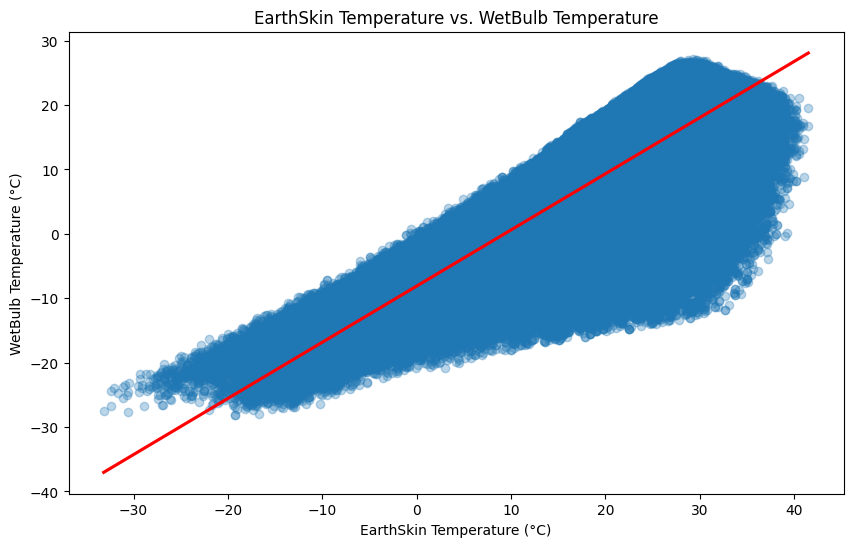

In [53]:
plt.figure(figsize=(10, 6))
sns.regplot(x='EarthSkinTemp', y='WetBulbTemp_2m', data=df, scatter_kws={'alpha':0.3}, line_kws={"color": "red"})
plt.title('EarthSkin Temperature vs. WetBulb Temperature')
plt.xlabel('EarthSkin Temperature (°C)')
plt.ylabel('WetBulb Temperature (°C)')
plt.show()


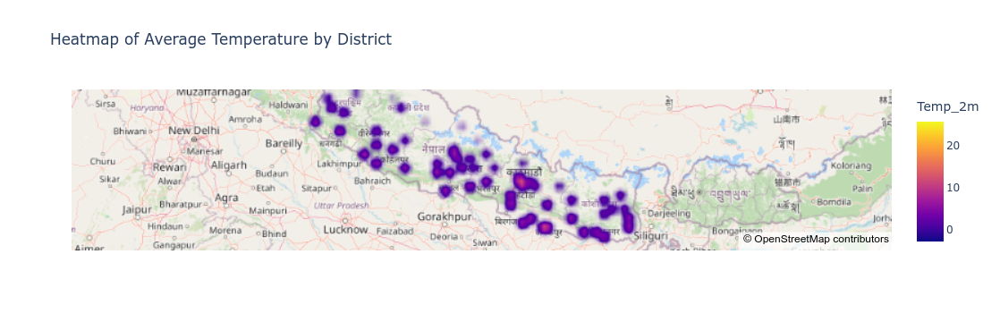

In [54]:
avg_temp_by_district = df.groupby('District').agg({'Temp_2m': 'mean', 'Latitude': 'mean', 'Longitude': 'mean'}).reset_index()

fig = px.density_mapbox(
    avg_temp_by_district,
    lat='Latitude',
    lon='Longitude',
    z='Temp_2m',
    radius=10,
    center=dict(lat=avg_temp_by_district['Latitude'].mean(), lon=avg_temp_by_district['Longitude'].mean()),
    mapbox_style="open-street-map",
    title='Heatmap of Average Temperature by District',
    zoom=5
)

fig.show()


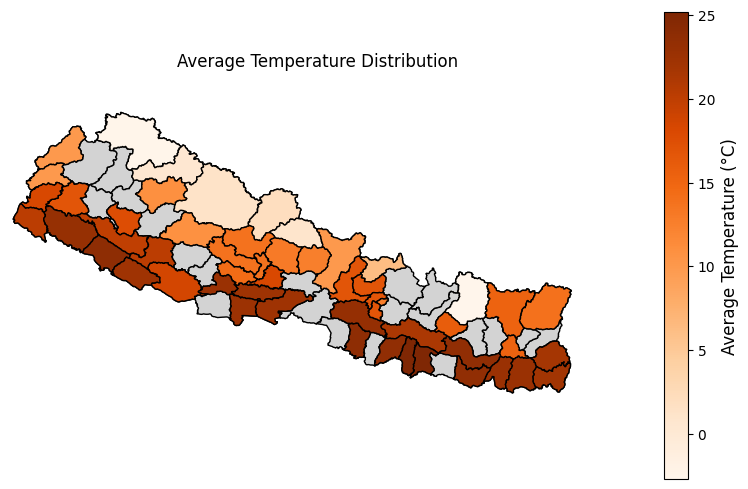

In [55]:
import geoplot as gplt
import matplotlib.pyplot as plt
import matplotlib as mpl
df_geo = geo_data[geo_data['District'].isin(df['District'].unique())]
avg_temp = df.groupby('District')['Temp_2m'].mean().reset_index()
df_geo = df_geo.merge(avg_temp, on='District')
fig, ax = plt.subplots(figsize=(8, 5))
geo_data.plot(ax=ax, color='lightgray', edgecolor='black')
gplt.choropleth(
	df_geo,
	hue='Temp_2m',
	cmap='Oranges',
	legend=False,
	ax=ax  
)
sm = plt.cm.ScalarMappable(cmap='Oranges', norm=mpl.colors.Normalize(vmin=df_geo['Temp_2m'].min(), vmax=df_geo['Temp_2m'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Average Temperature (°C)', fontsize=12)
plt.title('Average Temperature Distribution')
ax.set_xlim([80, 89])  
ax.set_ylim([26, 31])  
plt.tight_layout()
plt.show()

In [56]:

avg_wind_by_district = df.groupby('District').agg({'WindSpeed_50m': 'mean', 'Latitude': 'mean', 'Longitude': 'mean'}).reset_index()

fig = px.density_mapbox(
    avg_wind_by_district,
    lat='Latitude',
    lon='Longitude',
    z='WindSpeed_50m',
    radius=10,
    center=dict(lat=avg_wind_by_district['Latitude'].mean(), lon=avg_wind_by_district['Longitude'].mean()),
    mapbox_style="open-street-map",
    title='Heatmap of Average WindSpeed by District',
    zoom=5
)

fig.show()



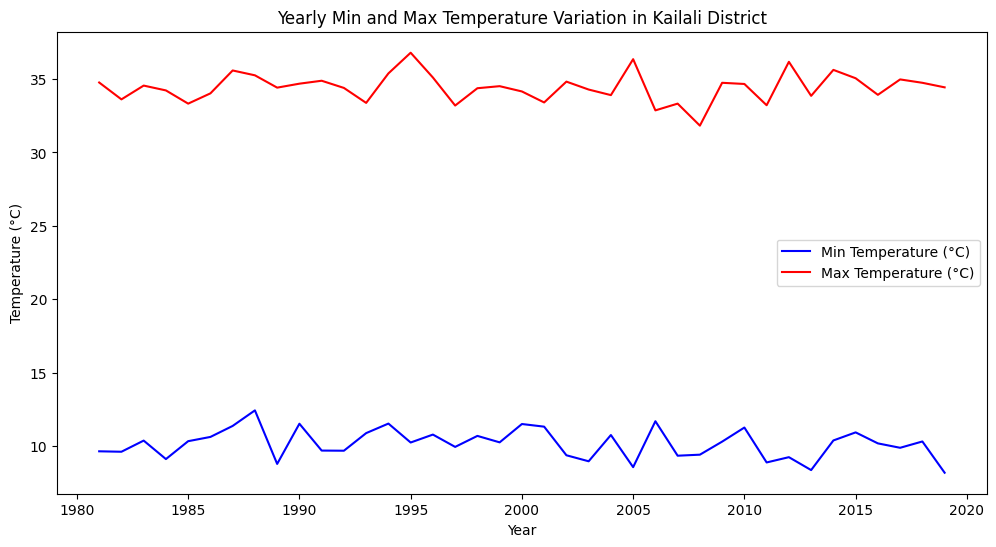

In [57]:
kailali_data = df[df['District'] == 'Kailali']
yearly_temp_variation = kailali_data.groupby('Year').agg({
    'Temp_2m': ['min', 'max']
}).reset_index()
yearly_temp_variation.columns = ['Year', 'MinTemp_2m', 'MaxTemp_2m']

plt.figure(figsize=(12, 6))
plt.plot(yearly_temp_variation['Year'], yearly_temp_variation['MinTemp_2m'], label='Min Temperature (°C)', color='blue')
plt.plot(yearly_temp_variation['Year'], yearly_temp_variation['MaxTemp_2m'], label='Max Temperature (°C)', color='red')
plt.title('Yearly Min and Max Temperature Variation in Kailali District')
plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.show()


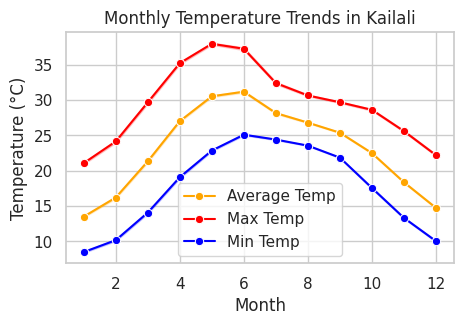

In [58]:
kailali_data = df[df['District'] == 'Kailali']
sns.set(style="whitegrid")
plt.figure(figsize=(5, 3))
sns.lineplot(data=kailali_data, x="Month", y="Temp_2m", marker="o", color="orange", label="Average Temp")
sns.lineplot(data=kailali_data, x="Month", y="MaxTemp_2m", marker="o", color="red", label="Max Temp")
sns.lineplot(data=kailali_data, x="Month", y="MinTemp_2m", marker="o", color="blue", label="Min Temp")
plt.title("Monthly Temperature Trends in Kailali")
plt.xlabel("Month")
plt.ylabel("Temperature (°C)")
plt.legend()
plt.show()


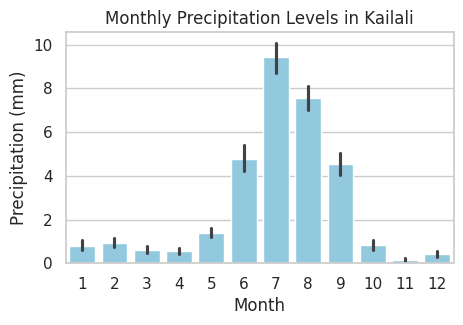

In [59]:
plt.figure(figsize=(5, 3))
sns.barplot(data=kailali_data, x="Month", y="Precip", color="skyblue")
plt.title("Monthly Precipitation Levels in Kailali")
plt.xlabel("Month")
plt.ylabel("Precipitation (mm)")
plt.show()


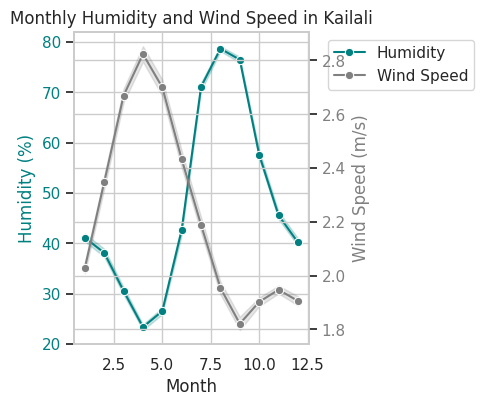

In [60]:
fig, ax1 = plt.subplots(figsize=(5,4))
color1 = 'teal'


ax1.set_xlabel("Month")
ax1.set_ylabel("Humidity (%)", color=color1)
sns.lineplot(data=kailali_data, x="Month", y="RH_2m", ax=ax1, color=color1, marker="o", label="Humidity", legend=False)
ax1.tick_params(axis="y", labelcolor=color1)


ax2 = ax1.twinx()
color2 = 'gray'
ax2.set_ylabel("Wind Speed (m/s)", color=color2)
sns.lineplot(data=kailali_data, x="Month", y="WindSpeed_10m", ax=ax2, color=color2, marker="o", label="Wind Speed", legend=False)
ax2.tick_params(axis="y", labelcolor=color2)


lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper left", bbox_to_anchor=(1.05, 1))


fig.tight_layout()
plt.title("Monthly Humidity and Wind Speed in Kailali")
plt.show()



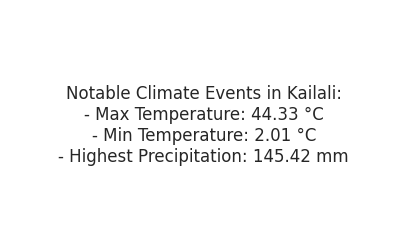

In [61]:

max_temp = kailali_data["MaxTemp_2m"].max()
min_temp = kailali_data["MinTemp_2m"].min()
max_precip = kailali_data["Precip"].max()

fig, ax = plt.subplots(figsize=(5, 3))
text = f"""Notable Climate Events in Kailali:
- Max Temperature: {max_temp} °C
- Min Temperature: {min_temp} °C
- Highest Precipitation: {max_precip} mm"""
ax.text(0.5, 0.5, text, ha='center', va='center', fontsize=12, wrap=True)
plt.axis("off")
plt.show()



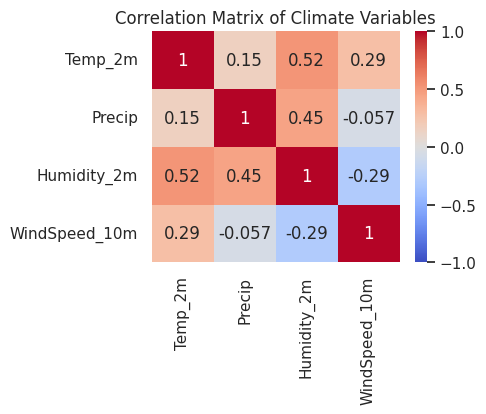

In [62]:
corr_matrix = kailali_data[['Temp_2m', 'Precip', 'Humidity_2m', 'WindSpeed_10m']].corr()
plt.figure(figsize=(4, 3))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix of Climate Variables")
plt.show()



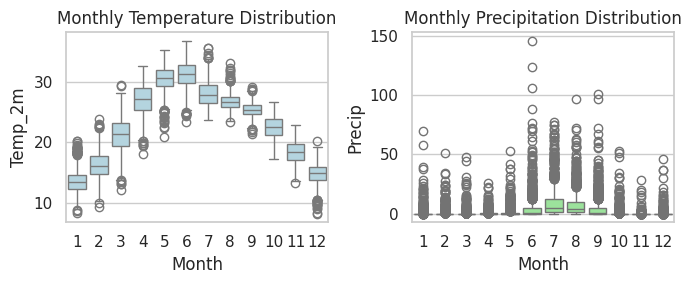

In [63]:
plt.figure(figsize=(7, 3))

plt.subplot(1, 2, 1)
sns.boxplot(data=kailali_data, x="Month", y="Temp_2m", color="lightblue")
plt.title("Monthly Temperature Distribution")

plt.subplot(1, 2, 2)
sns.boxplot(data=kailali_data, x="Month", y="Precip", color="lightgreen")
plt.title("Monthly Precipitation Distribution")

plt.tight_layout()
plt.show()


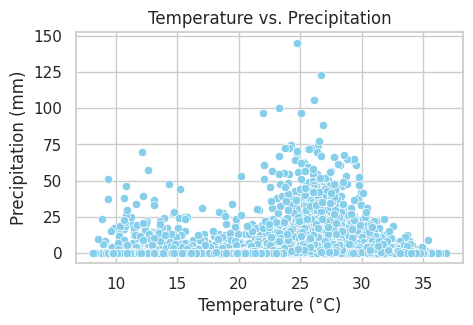

In [64]:
plt.figure(figsize=(5, 3))
sns.scatterplot(data=kailali_data, x="Temp_2m", y="Precip", color="skyblue")
plt.title("Temperature vs. Precipitation")
plt.xlabel("Temperature (°C)")
plt.ylabel("Precipitation (mm)")
plt.show()



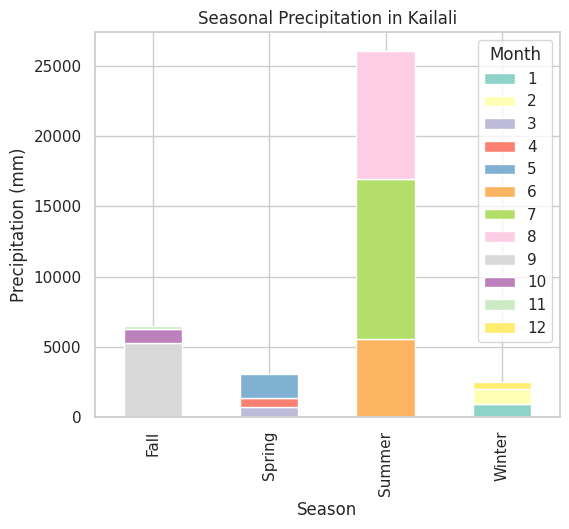

In [65]:
seasonal_precip = kailali_data.groupby(['Season', 'Month'])['Precip'].sum().unstack()
seasonal_precip.plot(kind='bar', stacked=True, figsize=(6, 5), cmap="Set3")
plt.title("Seasonal Precipitation in Kailali")
plt.xlabel("Season")
plt.ylabel("Precipitation (mm)")
plt.show()


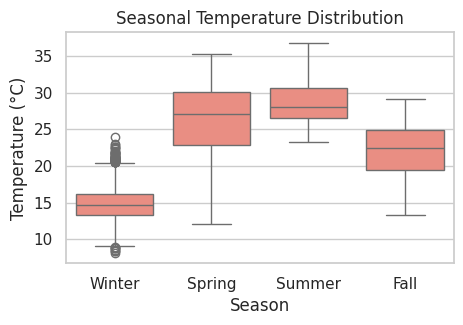

In [66]:
plt.figure(figsize=(5, 3))
sns.boxplot(data=kailali_data, x="Season", y="Temp_2m", color="salmon")
plt.title("Seasonal Temperature Distribution")
plt.xlabel("Season")
plt.ylabel("Temperature (°C)")
plt.show()


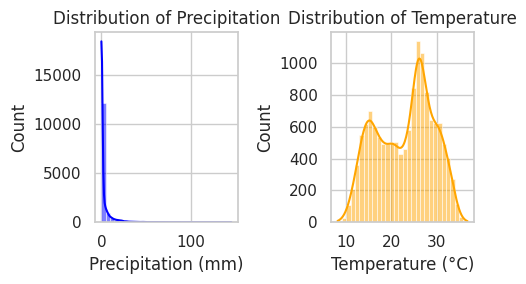

In [67]:
plt.figure(figsize=(5, 3))


plt.subplot(1, 2, 1)
sns.histplot(kailali_data['Precip'], bins=30, kde=True, color="blue")
plt.title("Distribution of Precipitation")
plt.xlabel("Precipitation (mm)")


plt.subplot(1, 2, 2)
sns.histplot(kailali_data['Temp_2m'], bins=30, kde=True, color="orange")
plt.title("Distribution of Temperature")
plt.xlabel("Temperature (°C)")

plt.tight_layout()
plt.show()


In [68]:
districts = df['District'].unique()
districts

array(['Arghakhanchi', 'Baglung', 'Baitadi', 'Bajang', 'Banke', 'Bara',
       'Bardiya', 'Bhaktapur', 'Chitawan', 'Dadeldhura', 'Dailekh',
       'Dang', 'Darchula', 'Dhading', 'Dhankuta', 'Dhanusa', 'Dolkha',
       'Dolpa', 'Doti', 'Gorkha', 'Gulmi', 'Humla', 'Ilam', 'Jhapa',
       'Jumla', 'Kabhre', 'Kailali', 'Kanchanpur', 'Kaski', 'Kathmandu',
       'Lalitpur', 'Lamjung', 'Mahottari', 'Makwanpur', 'Manang',
       'Morang', 'Mugu', 'Mustang', 'Myagdi', 'Nawalparasi', 'Nuwakot',
       'Okhaldhunga', 'Palpa', 'Panchther', 'Parbat', 'Rasuwa',
       'Routahat', 'Rukum', 'Rupandehi', 'Salyan', 'Sankhuwasabha',
       'Saptari', 'Sarlahi', 'Sindhuli', 'Solukhumbu', 'Sunsari',
       'Surkhet', 'Syangja', 'Tanahun', 'Taplejung', 'Terhathum',
       'Udayapur'], dtype=object)

In [69]:
terai_districts = [
    "Kailali", "Kanchanpur", "Banke", "Bardiya", "Dang", 
    "Rupandehi", "Nawalparasi", "Chitawan", 
    "Bara", "Routahat", "Sarlahi", "Mahottari", 
    "Dhanusa", "Saptari", "Sunsari", "Morang", "Jhapa"
]

In [70]:
# Filter the dataset for Terai districts
terai_data = df[df['District'].isin(terai_districts)]

# Save the filtered dataset if needed
terai_data.to_csv("Downloads/Data_Project/terai_climate.csv", index=False)



In [71]:
terai_data.shape


(242148, 23)

In [72]:
# Ensure CRS is set correctly for the full map of Nepal
geo_data = geo_data.set_crs("EPSG:4326")

# Filter for Terai districts based on your 'terai_data'
terai_geo = geo_data[geo_data['District'].isin(terai_data['District'].unique())]


In [73]:
# Correcting the district names
terai_data.loc[:,'District'] = terai_data['District'].replace({'Chitawan': 'Chitwan', 'Routahat': 'Rautahat'})
terai_geo.loc[:,'District'] = terai_geo['District'].replace({'Chitawan': 'Chitwan', 'Routahat': 'Rautahat'})


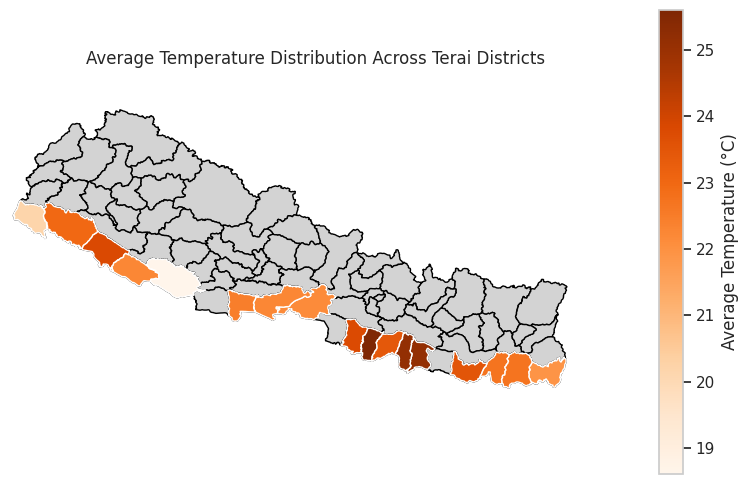

In [74]:
terai_geo = geo_data[geo_data['District'].isin(terai_data['District'].unique())]

# Group temperature data and reset index for Terai districts
avg_temp = terai_data.groupby('District')['Temp_2m'].mean().reset_index()
# Merge Terai districts with average temperature data
terai_geo = terai_geo.merge(avg_temp, on='District')
# Plot the full map of Nepal with the Terai districts highlighted
fig, ax = plt.subplots(figsize=(8, 5))
# Plot the entire Nepal map first with light color (gray)
geo_data.plot(ax=ax, color='lightgray', edgecolor='black')
# Overlay the Terai districts with choropleth colors (based on Temp_2m)
gplt.choropleth(
    terai_geo,
    hue='Temp_2m',
    cmap='Oranges',
    legend=False,
    ax=ax  
)
sm = plt.cm.ScalarMappable(cmap='Oranges', norm=mpl.colors.Normalize(vmin=terai_geo['Temp_2m'].min(), vmax=terai_geo['Temp_2m'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Average Temperature (°C)', fontsize=12)
plt.title('Average Temperature Distribution Across Terai Districts')
# Set the axis limits to ensure the entire map is visible
ax.set_xlim([80, 89])  
ax.set_ylim([26, 31])  
# Adjust layout to prevent title from cutting off and ensure all map areas are visible

plt.tight_layout()
plt.show() 

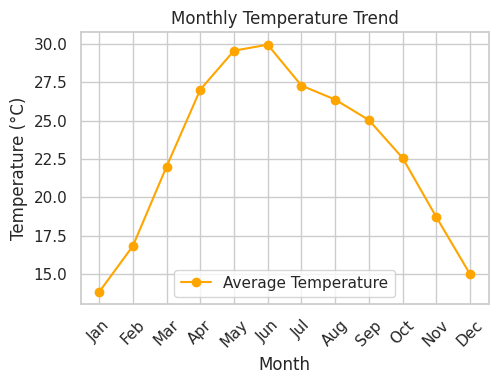

In [75]:


# Assuming monthly_avg_temp is already defined
monthly_avg_temp = terai_data.groupby('Month')['Temp_2m'].mean()

# Create a list of month names
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Plot the monthly average temperature
plt.figure(figsize=(5, 4))
plt.plot(monthly_avg_temp.index, monthly_avg_temp.values, marker='o', color='orange', label='Average Temperature')

# Set the title and labels
plt.title('Monthly Temperature Trend')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')

# Set the x-axis ticks to show month names, adjusting for 1-based indexing
plt.xticks(monthly_avg_temp.index, month_names, rotation=45)
plt.grid(True)
# Show the legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


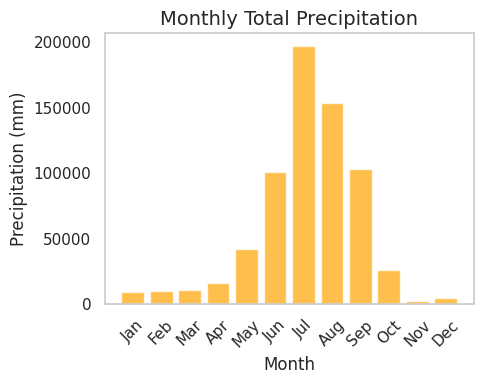

In [76]:
monthly_precip = terai_data.groupby('Month')['Precip'].sum()
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

plt.figure(figsize=(5, 4))
plt.bar(monthly_precip.index, monthly_precip.values, color='orange', alpha=0.7)
plt.title('Monthly Total Precipitation', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Precipitation (mm)', fontsize=12)
# Set the x-axis ticks to show month names, adjusting for 1-based indexing
plt.xticks(monthly_avg_temp.index, month_names, rotation=45)
plt.grid(False)
# Show the legend
plt.tight_layout()
plt.show()

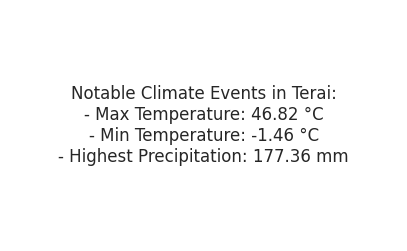

In [77]:
max_temp = terai_data["MaxTemp_2m"].max()
min_temp = terai_data["MinTemp_2m"].min()
max_precip = terai_data["Precip"].max()

fig, ax = plt.subplots(figsize=(5, 3))
text = f"""Notable Climate Events in Terai:
- Max Temperature: {max_temp} °C
- Min Temperature: {min_temp} °C
- Highest Precipitation: {max_precip} mm"""
ax.text(0.5, 0.5, text, ha='center', va='center', fontsize=12, wrap=True)
plt.axis("off")
plt.show()


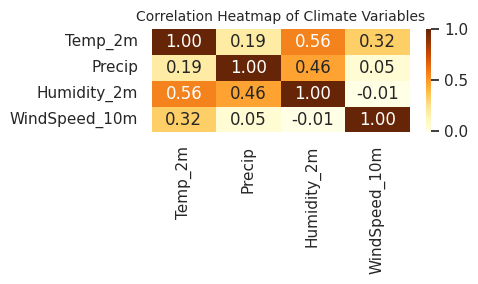

In [78]:
correlation_matrix = terai_data[['Temp_2m', 'Precip', 'Humidity_2m', 'WindSpeed_10m']].corr()

plt.figure(figsize=(5, 3))
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap='YlOrBr',  # Colormap with orange shades
    cbar=True, 
    fmt='.2f'
)
plt.title('Correlation Heatmap of Climate Variables', fontsize=10)
plt.tight_layout()
plt.show()



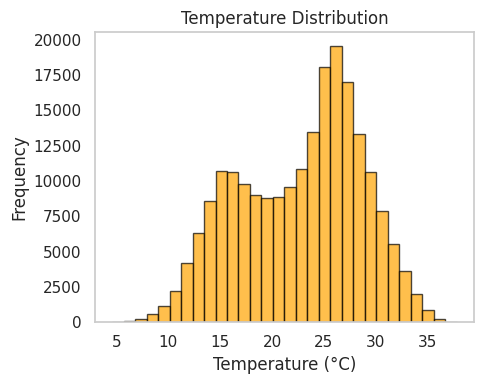

In [79]:
plt.figure(figsize=(5, 4))
terai_data[terai_data['District'].isin(terai_districts)]['Temp_2m'].plot(kind='hist', bins=30, color='orange', edgecolor='black', alpha=0.7)

plt.title('Temperature Distribution')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.grid(False)
plt.tight_layout()
plt.show()


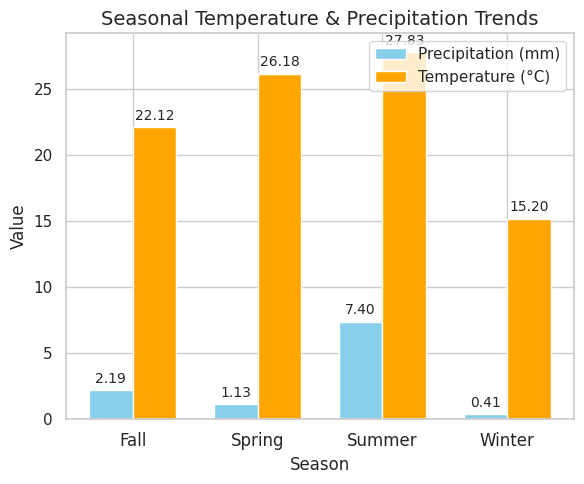

In [80]:

# Aggregate data by season
seasonal_data = terai_data.groupby('Season').agg({
    'Precip': 'mean',  # Average precipitation
    'Temp_2m': 'mean'  # Average temperature
}).reset_index()

# Plot grouped bar chart
fig, ax = plt.subplots(figsize=(6, 5))
width = 0.35  # Width of bars
x = range(len(seasonal_data))

# Bar chart for precipitation
bars1 = ax.bar(x, seasonal_data['Precip'], width, label='Precipitation (mm)', color='skyblue')

# Bar chart for temperature
bars2 = ax.bar([p + width for p in x], seasonal_data['Temp_2m'], width, label='Temperature (°C)', color='orange')

# Labeling
ax.set_xlabel('Season', fontsize=12)
ax.set_ylabel('Value', fontsize=12)
ax.set_title('Seasonal Temperature & Precipitation Trends', fontsize=14)
ax.set_xticks([p + width / 2 for p in x])
ax.set_xticklabels(seasonal_data['Season'], fontsize=12)
ax.legend()

# Display the values on top of bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



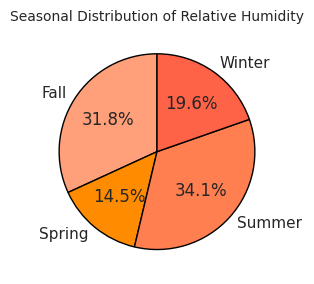

In [81]:
seasonal_rh = terai_data.groupby('Season')['RH_2m'].mean()
colors = ['#FFA07A', '#FF8C00', '#FF7F50', '#FF6347']  
plt.figure(figsize=(5, 3))
plt.pie(
    seasonal_rh, 
    labels=seasonal_rh.index, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors, 
    wedgeprops={'edgecolor': 'black'}
)
plt.title('Seasonal Distribution of Relative Humidity', fontsize=10)
plt.tight_layout()
plt.show()


In [82]:
districts = df['District'].unique()
districts

array(['Arghakhanchi', 'Baglung', 'Baitadi', 'Bajang', 'Banke', 'Bara',
       'Bardiya', 'Bhaktapur', 'Chitawan', 'Dadeldhura', 'Dailekh',
       'Dang', 'Darchula', 'Dhading', 'Dhankuta', 'Dhanusa', 'Dolkha',
       'Dolpa', 'Doti', 'Gorkha', 'Gulmi', 'Humla', 'Ilam', 'Jhapa',
       'Jumla', 'Kabhre', 'Kailali', 'Kanchanpur', 'Kaski', 'Kathmandu',
       'Lalitpur', 'Lamjung', 'Mahottari', 'Makwanpur', 'Manang',
       'Morang', 'Mugu', 'Mustang', 'Myagdi', 'Nawalparasi', 'Nuwakot',
       'Okhaldhunga', 'Palpa', 'Panchther', 'Parbat', 'Rasuwa',
       'Routahat', 'Rukum', 'Rupandehi', 'Salyan', 'Sankhuwasabha',
       'Saptari', 'Sarlahi', 'Sindhuli', 'Solukhumbu', 'Sunsari',
       'Surkhet', 'Syangja', 'Tanahun', 'Taplejung', 'Terhathum',
       'Udayapur'], dtype=object)

In [83]:
middle_region = [
    "Chitawan", "Dhading", "Dhanusa", "Dolkha",  
    "Kabhre", "Kathmandu", "Lalitpur", "Bhaktapur", 
    "Makwanpur",  "Nuwakot",  "Bara", 
    "Rasuwa", "Sindhuli", "Mahottari", "Sarlahi","Routahat"
]


In [84]:
# Filter the dataset for Middle Region
middle_data = df[df['District'].isin(middle_region)]        

# Save the filtered dataset if needed
middle_data.to_csv("Downloads/Data_Project/middle_climate.csv", index=False)

In [85]:
middle_data.shape

(227904, 23)

In [86]:
middle_data.head()

,District,Latitude,Longitude,Precip,Pressure,Humidity_2m,RH_2m,Temp_2m,WetBulbTemp_2m,MaxTemp_2m,...,MaxWindSpeed_10m,MinWindSpeed_10m,WindSpeed_50m,MaxWindSpeed_50m,MinWindSpeed_50m,Year,Month,Day,Season,Temp_2m_RollingAvg
Date,,,,,,,,,,,,,,,,,,,,,
1981-01-01,Bara,27.2,85.0,0.00,95.66,5.20,48.44,14.46,3.62,21.70,...,3.48,0.25,2.22,3.46,0.35,1981,1,1,Winter,12.086667
1981-01-02,Bara,27.2,85.0,0.00,95.72,5.14,46.55,14.87,3.47,22.08,...,2.62,1.01,2.12,3.06,1.30,1981,1,2,Winter,12.116333
1981-01-03,Bara,27.2,85.0,0.00,95.68,5.50,48.78,15.20,4.42,22.24,...,2.85,0.84,2.46,3.42,0.93,1981,1,3,Winter,12.150000
1981-01-04,Bara,27.2,85.0,0.01,95.64,5.66,50.37,15.16,4.88,22.01,...,3.18,0.30,2.55,3.48,0.34,1981,1,4,Winter,12.146667
1981-01-05,Bara,27.2,85.0,0.31,95.62,5.66,50.33,15.13,4.82,21.66,...,2.77,0.94,2.71,3.90,1.32,1981,1,5,Winter,12.132333


In [87]:
# Ensure CRS is set correctly for the full map of Nepal
geo_data = geo_data.set_crs("EPSG:4326")


middle_geo = geo_data[geo_data['District'].isin(middle_data['District'].unique())]

In [88]:
# Correcting the district names
middle_data.loc[:,'District'] = middle_data['District'].replace({'Kabhre': 'Kavrepalanchok', 'Chitawan': 'Chitwan', 'Routahat': 'Rautahat', 'Dolkha': 'Dolakha'})
middle_geo.loc[:,'District'] = middle_geo['District'].replace({ 'Kabhre': 'Kavrepalanchok', 'Chitawan': 'Chitwan', 'Routahat': 'Rautahat', 'Dolkha': 'Dolakha'})


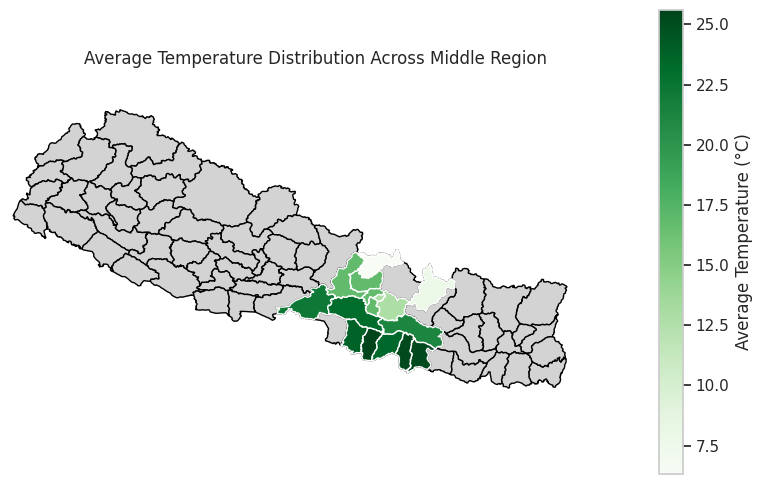

In [89]:
middle_geo = geo_data[geo_data['District'].isin(middle_data['District'].unique())]
avg_temp = middle_data.groupby('District')['Temp_2m'].mean().reset_index()

middle_geo = middle_geo.merge(avg_temp, on='District')


fig, ax = plt.subplots(figsize=(8, 5))

geo_data.plot(ax=ax, color='lightgray', edgecolor='black')

gplt.choropleth(
    middle_geo,
    hue='Temp_2m',
    cmap='Greens',
    legend=False,
    ax=ax  
)
sm = plt.cm.ScalarMappable(cmap='Greens', norm=mpl.colors.Normalize(vmin=middle_geo['Temp_2m'].min(), vmax=middle_geo['Temp_2m'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Average Temperature (°C)')

plt.title('Average Temperature Distribution Across Middle Region')

ax.set_xlim([80, 89])  
ax.set_ylim([26, 31])  

plt.tight_layout()


plt.show()

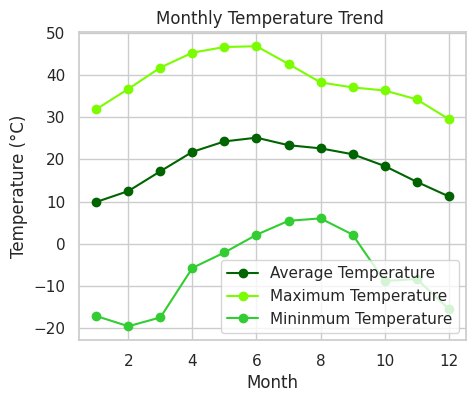

In [90]:
monthly_avg_temp = middle_data.groupby('Month')['Temp_2m'].mean()
monthly_max_temp = middle_data.groupby('Month')['MaxTemp_2m'].max()
monthly_min_temp = middle_data.groupby('Month')['MinTemp_2m'].min()
plt.figure(figsize=(5, 4))
plt.plot(monthly_avg_temp.index, monthly_avg_temp.values, marker='o', color='#006400', label='Average Temperature')
plt.plot(monthly_max_temp.index, monthly_max_temp.values, marker='o', color='#7CFC00', label='Maximum Temperature')
plt.plot(monthly_min_temp.index, monthly_min_temp.values, marker='o', color='#32CD32', label='Mininmum Temperature')
plt.title('Monthly Temperature Trend ')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.show()


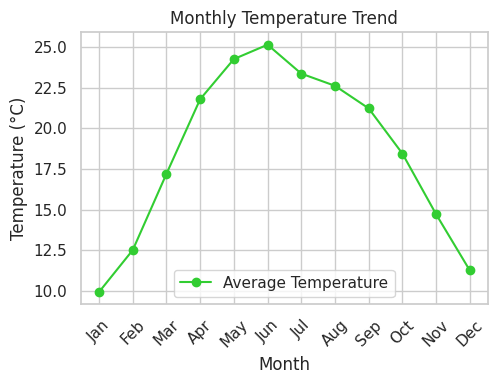

In [91]:
# Assuming monthly_avg_temp is already defined
monthly_avg_temp = middle_data.groupby('Month')['Temp_2m'].mean()

# Create a list of month names
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Plot the monthly average temperature
plt.figure(figsize=(5, 4))
plt.plot(monthly_avg_temp.index, monthly_avg_temp.values, marker='o', color='#32CD32', label='Average Temperature')

# Set the title and labels
plt.title('Monthly Temperature Trend')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')

# Set the x-axis ticks to show month names, adjusting for 1-based indexing
plt.xticks(monthly_avg_temp.index, month_names, rotation=45)
plt.grid(True)
# Show the legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


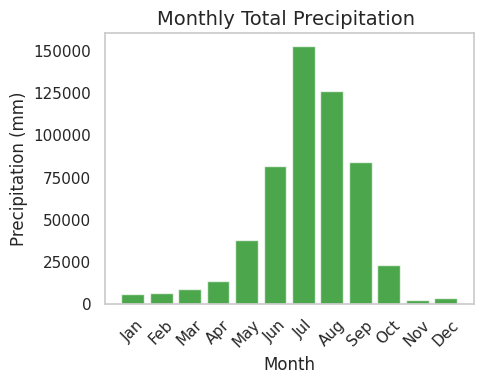

In [92]:
monthly_precip = middle_data.groupby('Month')['Precip'].sum()
month_names = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
plt.figure(figsize=(5, 4))
plt.bar(monthly_precip.index, monthly_precip.values, color='green', alpha=0.7)
plt.title('Monthly Total Precipitation ', fontsize=14)
plt.xlabel('Month', fontsize=12)
plt.ylabel('Precipitation (mm)', fontsize=12)
plt.xticks(monthly_precip.index, month_names, rotation=45)
plt.grid(False)
plt.tight_layout()
plt.show()

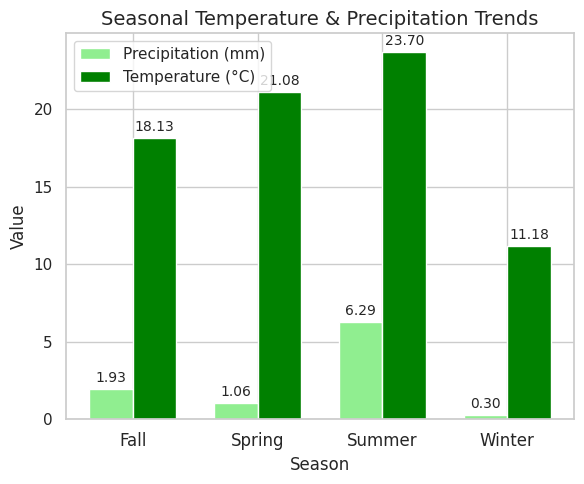

In [93]:

# Aggregate data by season
seasonal_data = middle_data.groupby('Season').agg({
    'Precip': 'mean',  # Average precipitation
    'Temp_2m': 'mean'  # Average temperature
}).reset_index()

# Plot grouped bar chart
fig, ax = plt.subplots(figsize=(6, 5))
width = 0.35  # Width of bars
x = range(len(seasonal_data))

# Bar chart for precipitation
bars1 = ax.bar(x, seasonal_data['Precip'], width, label='Precipitation (mm)', color='lightgreen')

# Bar chart for temperature
bars2 = ax.bar([p + width for p in x], seasonal_data['Temp_2m'], width, label='Temperature (°C)', color='green')

# Labeling
ax.set_xlabel('Season', fontsize=12)
ax.set_ylabel('Value', fontsize=12)
ax.set_title('Seasonal Temperature & Precipitation Trends', fontsize=14)
ax.set_xticks([p + width / 2 for p in x])
ax.set_xticklabels(seasonal_data['Season'], fontsize=12)
ax.legend()

# Display the values on top of bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



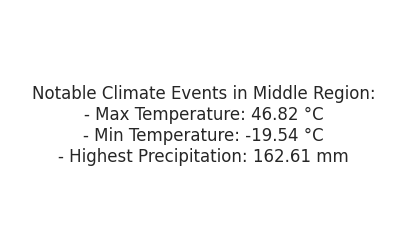

In [94]:
max_temp = middle_data["MaxTemp_2m"].max()
min_temp = middle_data["MinTemp_2m"].min()
max_precip = middle_data["Precip"].max()

fig, ax = plt.subplots(figsize=(5, 3))
text = f"""Notable Climate Events in Middle Region:
- Max Temperature: {max_temp} °C
- Min Temperature: {min_temp} °C
- Highest Precipitation: {max_precip} mm"""
ax.text(0.5, 0.5, text, ha='center', va='center', fontsize=12, wrap=True)
plt.axis("off")
plt.show()

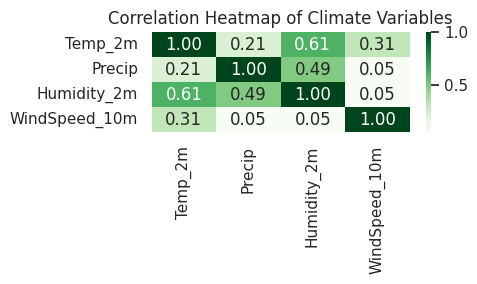

In [95]:
correlation_matrix = middle_data[['Temp_2m', 'Precip', 'Humidity_2m', 'WindSpeed_10m']].corr()

plt.figure(figsize=(5, 3))
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap='Greens',  
    cbar=True, 
    fmt='.2f'
)
plt.title('Correlation Heatmap of Climate Variables')
plt.tight_layout()
plt.show()

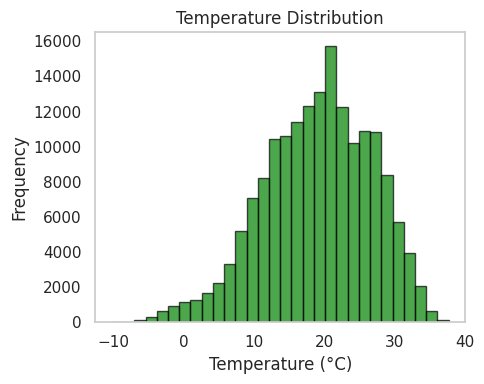

In [96]:
plt.figure(figsize=(5, 4))
middle_data[middle_data['District'].isin(middle_region)]['Temp_2m'].plot(kind='hist', bins=30, color='green', edgecolor='black', alpha=0.7)

plt.title('Temperature Distribution')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.grid(False)
plt.tight_layout()
plt.show()


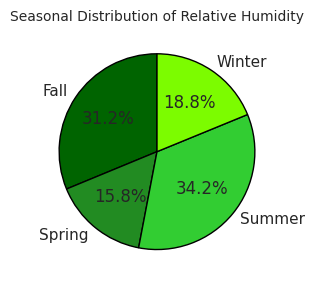

In [97]:
seasonal_rh = middle_data.groupby('Season')['RH_2m'].mean()
colors = ['#006400', '#228B22', '#32CD32', '#7CFC00']  
plt.figure(figsize=(5, 3))
plt.pie(
    seasonal_rh, 
    labels=seasonal_rh.index, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors, 
    wedgeprops={'edgecolor': 'black'}
)
plt.title('Seasonal Distribution of Relative Humidity', fontsize=10)
plt.tight_layout()
plt.show()


In [98]:
first_quarter = [1,2,3,4]

In [99]:
# Filter the dataset for First Quarter
first_data = df[df['Month'].isin(first_quarter)]

# Save the filtered dataset if needed
first_data.to_csv("Downloads/Data_Project/firstquarter_climate.csv", index=False)

In [100]:
first_data.shape
first_data.tail()

,District,Latitude,Longitude,Precip,Pressure,Humidity_2m,RH_2m,Temp_2m,WetBulbTemp_2m,MaxTemp_2m,...,MaxWindSpeed_10m,MinWindSpeed_10m,WindSpeed_50m,MaxWindSpeed_50m,MinWindSpeed_50m,Year,Month,Day,Season,Temp_2m_RollingAvg
Date,,,,,,,,,,,,,,,,,,,,,
2019-04-26,Udayapur,26.9,86.5,1.66,94.77,12.61,44.44,30.19,16.67,35.29,...,2.99,0.67,2.25,2.93,0.91,2019,4,26,Spring,26.509667
2019-04-27,Udayapur,26.9,86.5,3.81,94.64,11.60,40.89,30.17,15.25,36.09,...,4.06,0.27,2.57,4.37,0.34,2019,4,27,Spring,26.671000
2019-04-28,Udayapur,26.9,86.5,6.69,94.58,11.47,42.43,29.32,14.96,36.27,...,3.78,0.67,3.36,4.65,0.67,2019,4,28,Spring,26.770000
2019-04-29,Udayapur,26.9,86.5,0.75,94.65,10.09,38.31,28.89,12.96,36.54,...,3.73,0.85,3.54,4.72,0.89,2019,4,29,Spring,26.872000
2019-04-30,Udayapur,26.9,86.5,0.94,94.65,10.29,38.72,29.05,13.26,36.55,...,4.07,1.03,3.97,4.87,1.62,2019,4,30,Spring,26.988667


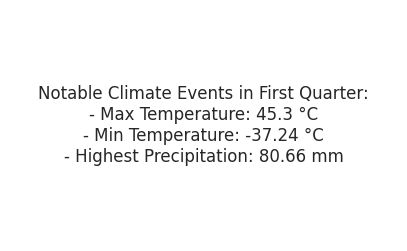

In [101]:
max_temp = first_data["MaxTemp_2m"].max()
min_temp = first_data["MinTemp_2m"].min()
max_precip = first_data["Precip"].max()

fig, ax = plt.subplots(figsize=(5, 3))
text = f"""Notable Climate Events in First Quarter:
- Max Temperature: {max_temp} °C
- Min Temperature: {min_temp} °C
- Highest Precipitation: {max_precip} mm"""
ax.text(0.5, 0.5, text, ha='center', va='center', fontsize=12, wrap=True)
plt.axis("off")
plt.show()


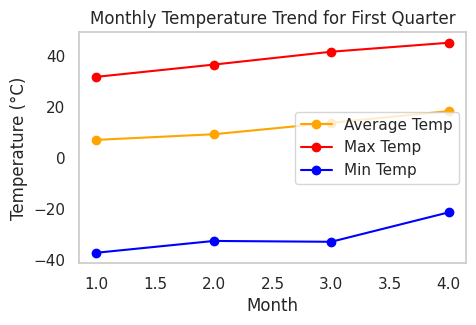

In [102]:
first_avg_temp = first_data.groupby('Month')['Temp_2m'].mean()
first_max_temp = first_data.groupby('Month')['MaxTemp_2m'].max()
first_min_temp = first_data.groupby('Month')['MinTemp_2m'].min()

plt.figure(figsize=(5, 3))
plt.plot(first_avg_temp.index, first_avg_temp.values, marker='o', label='Average Temp', color='orange')
plt.plot(first_max_temp.index, first_max_temp.values, marker='o', label='Max Temp', color='red')
plt.plot(first_min_temp.index, first_min_temp.values, marker='o', label='Min Temp', color='blue')

plt.title('Monthly Temperature Trend for First Quarter')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(False)
plt.show()


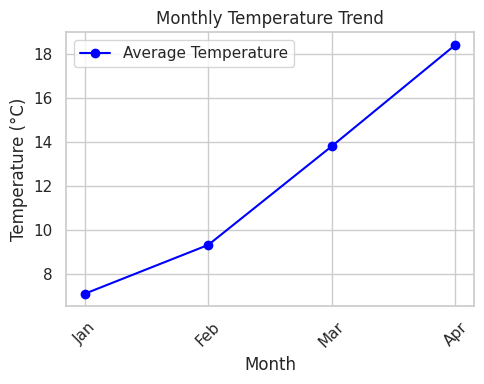

In [103]:
# Assuming monthly_avg_temp is already defined
monthly_avg_temp = first_data.groupby('Month')['Temp_2m'].mean()

# Create a list of month names
month_names = ['Jan', 'Feb', 'Mar', 'Apr']

# Plot the monthly average temperature
plt.figure(figsize=(5, 4))
plt.plot(monthly_avg_temp.index, monthly_avg_temp.values, marker='o', color='blue', label='Average Temperature')

# Set the title and labels
plt.title('Monthly Temperature Trend')
plt.xlabel('Month')
plt.ylabel('Temperature (°C)')

# Set the x-axis ticks to show month names, adjusting for 1-based indexing
plt.xticks(monthly_avg_temp.index, month_names, rotation=45)
plt.grid(True)
# Show the legend
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()


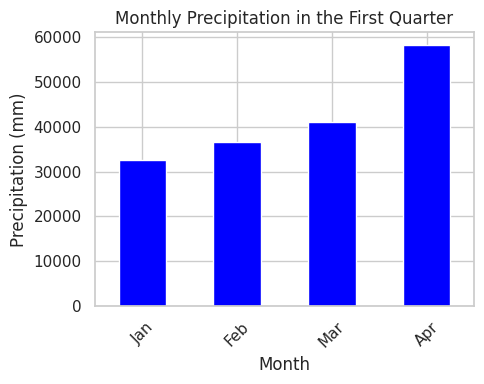

In [104]:

first_monthly_precip = first_data.groupby('Month')['Precip'].sum()
plt.figure(figsize=(5, 4))
first_monthly_precip.plot(kind='bar', color='blue')

plt.title('Monthly Precipitation in the First Quarter')
plt.xlabel('Month')
plt.ylabel('Precipitation (mm)')
plt.xticks(ticks=[0, 1, 2, 3], labels=['Jan', 'Feb', 'Mar', 'Apr'], rotation=45)
plt.tight_layout()
plt.show()



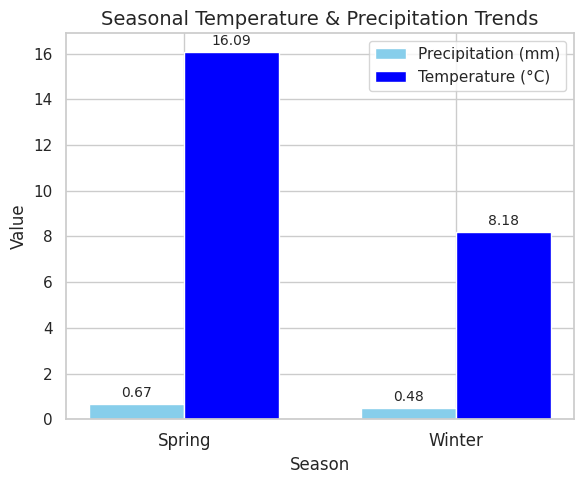

In [105]:

# Aggregate data by season
seasonal_data = first_data.groupby('Season').agg({
    'Precip': 'mean',  # Average precipitation
    'Temp_2m': 'mean'  # Average temperature
}).reset_index()

# Plot grouped bar chart
fig, ax = plt.subplots(figsize=(6, 5))
width = 0.35  # Width of bars
x = range(len(seasonal_data))

# Bar chart for precipitation
bars1 = ax.bar(x, seasonal_data['Precip'], width, label='Precipitation (mm)', color='skyblue')

# Bar chart for temperature
bars2 = ax.bar([p + width for p in x], seasonal_data['Temp_2m'], width, label='Temperature (°C)', color='blue')

# Labeling
ax.set_xlabel('Season', fontsize=12)
ax.set_ylabel('Value', fontsize=12)
ax.set_title('Seasonal Temperature & Precipitation Trends', fontsize=14)
ax.set_xticks([p + width / 2 for p in x])
ax.set_xticklabels(seasonal_data['Season'], fontsize=12)
ax.legend()

# Display the values on top of bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()



Text(0.5, 1.0, 'Correlation Heatmap of Climate Variables')

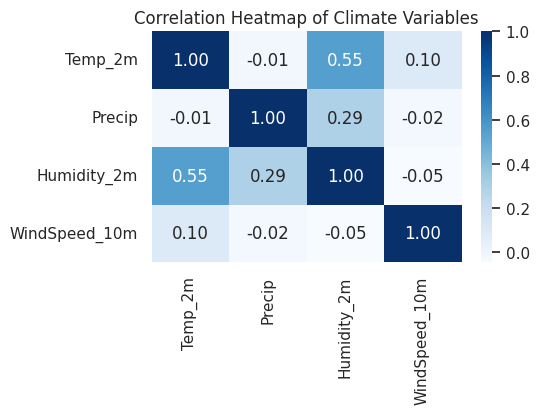

In [106]:
correlation_matrix = first_data[['Temp_2m', 'Precip', 'Humidity_2m', 'WindSpeed_10m']].corr()
plt.figure(figsize=(5, 3))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', cbar=True, fmt='.2f')
plt.title('Correlation Heatmap of Climate Variables')

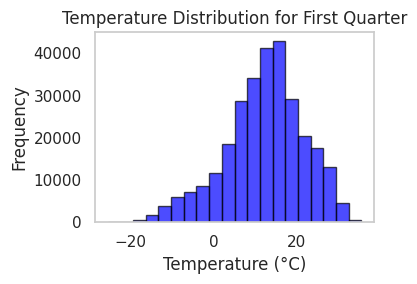

In [107]:
plt.figure(figsize=(4, 3))
first_data['Temp_2m'].plot(kind='hist', bins=20, color='blue', edgecolor='black', alpha=0.7)

plt.title('Temperature Distribution for First Quarter')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.grid(False)
plt.tight_layout()
plt.show()


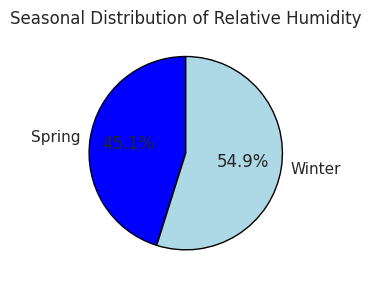

In [108]:
seasonal_rh = first_data.groupby('Season')['RH_2m'].mean()
colors = ['blue', 'lightblue', 'orange', 'lightblue']  
plt.figure(figsize=(5, 3))
plt.pie(
    seasonal_rh, 
    labels=seasonal_rh.index, 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=colors, 
    wedgeprops={'edgecolor': 'black'}
)
plt.title('Seasonal Distribution of Relative Humidity')
plt.tight_layout()
plt.show()

In [109]:
# Ensure CRS is set correctly for the full map of Nepal
geo_data = geo_data.set_crs("EPSG:4326")


first_geo = geo_data[geo_data['District'].isin(first_data['District'].unique())]

In [110]:
first_data.loc[:,'District'] = first_data['District'].replace({'Terhathum':'Tehrathum','Panchther':'Panchthar','Tanahun':'Tanahu','Bajang':'Bajhang','Kabhre': 'Kavrepalanchok', 'Chitawan': 'Chitwan', 'Routahat': 'Rautahat', 'Dolkha': 'Dolakha'})
first_geo.loc[:,'District'] = first_geo['District'].replace({ 'Terhathum':'Tehrathum','Panchther':'Panchthar','Tanahun':'Tanahu','Bajang':'Bajhang','Kabhre': 'Kavrepalanchok', 'Chitawan': 'Chitwan', 'Routahat': 'Rautahat', 'Dolkha': 'Dolakha'})


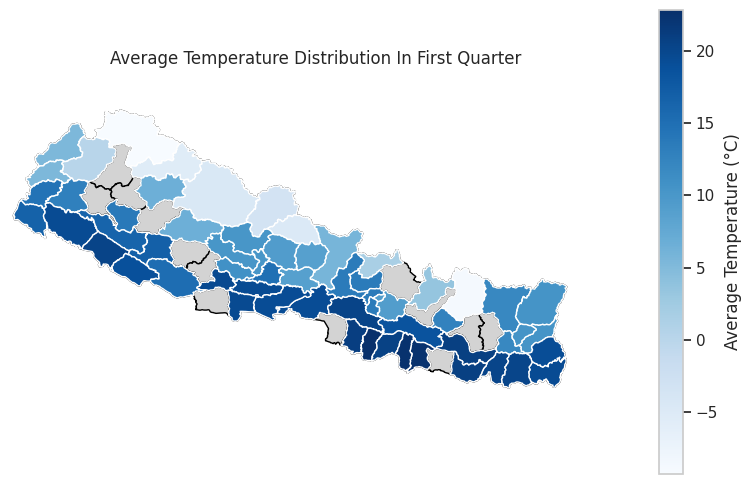

In [111]:

first_geo = geo_data[geo_data['District'].isin(first_data['District'].unique())]

avg_temp = first_data.groupby('District')['Temp_2m'].mean().reset_index()

first_geo = first_geo.merge(avg_temp, on='District')


fig, ax = plt.subplots(figsize=(8, 5))

geo_data.plot(ax=ax, color='lightgray', edgecolor='black')

gplt.choropleth(
    first_geo,
    hue='Temp_2m',
    cmap='Blues',
    legend=False,
    ax=ax  
)
sm = plt.cm.ScalarMappable(cmap='Blues', norm=mpl.colors.Normalize(vmin=first_geo['Temp_2m'].min(), vmax=first_geo['Temp_2m'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Average Temperature (°C)')

plt.title('Average Temperature Distribution In First Quarter')

ax.set_xlim([80, 89])  
ax.set_ylim([26, 31])  

plt.tight_layout()

In [112]:
df1=pd.read_csv('Downloads/Data_Project/agriculture.csv')

In [113]:
df1.head()

,Adm0 En,ADM0 EN (Nepal province.shp),Adm0 Pcode,ADM0 PCODE (Nepal province.shp),Adm1 En,ADM1 EN (Nepal province.shp),Adm1 Pcode,ADM1 PCODE (Nepal province.shp),Adm1 Ref,Adm1Alt1En,...,Kg Per Hectare,Measure,Metric Ton,Number of Records,Production,Shape Area,Shape Area (Nepal province.shp),Shape Leng,Shape Leng (Nepal province.shp),Yield
0,Nepal,Nepal,NP,NP,5,5,NP05,NP05,NaN,NaN,...,Kg Per 0e5/14/1901tare,500.000000,NaN,1,10.000000,0.150998,1.768381,2.231063,12.624719,500.000000
1,Nepal,Nepal,NP,NP,5,5,NP05,NP05,NaN,NaN,...,Kg Per 16e10/27/1901 4:00:00 PMtare,666.666667,NaN,1,20.000000,0.150998,1.768381,2.231063,12.624719,666.666667
2,Nepal,Nepal,NP,NP,5,5,NP05,NP05,NaN,NaN,...,Kg Per 0e8/22/1901tare,600.000000,NaN,1,30.000000,0.150998,1.768381,2.231063,12.624719,600.000000
3,Nepal,Nepal,NP,NP,5,5,NP05,NP05,NaN,NaN,...,Kg Per 0e5/14/1901tare,500.000000,NaN,1,20.000000,0.150998,1.768381,2.231063,12.624719,500.000000
4,Nepal,Nepal,NP,NP,5,5,NP05,NP05,NaN,NaN,...,Kg Per 0e2/3/1901tare,400.000000,NaN,1,23.330442,0.066359,1.768381,1.501964,12.624719,400.000000


In [114]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68243 entries, 0 to 68242
Data columns (total 41 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Adm0 En                          68243 non-null  object 
 1   ADM0 EN (Nepal province.shp)     68243 non-null  object 
 2   Adm0 Pcode                       68243 non-null  object 
 3   ADM0 PCODE (Nepal province.shp)  68243 non-null  object 
 4   Adm1 En                          68243 non-null  int64  
 5   ADM1 EN (Nepal province.shp)     68243 non-null  int64  
 6   Adm1 Pcode                       68243 non-null  object 
 7   ADM1 PCODE (Nepal province.shp)  68243 non-null  object 
 8   Adm1 Ref                         0 non-null      float64
 9   Adm1Alt1En                       0 non-null      float64
 10  Adm1Alt2En                       0 non-null      float64
 11  Crop                             68243 non-null  object 
 12  Crop Type         

In [115]:
df1.columns

Index(['Adm0 En', 'ADM0 EN (Nepal province.shp)', 'Adm0 Pcode',
       'ADM0 PCODE (Nepal province.shp)', 'Adm1 En',
       'ADM1 EN (Nepal province.shp)', 'Adm1 Pcode',
       'ADM1 PCODE (Nepal province.shp)', 'Adm1 Ref', 'Adm1Alt1En',
       'Adm1Alt2En', 'Crop', 'Crop Type', 'Date', 'date (Nepal province.shp)',
       'Date1', 'Dist Alt1E', 'Dist Alt2E', 'Dist En', 'Dist Pcode',
       'Dist Ref', 'District', 'Province', 'Unit', 'Valid On', 'Valid To',
       'validOn (Nepal province.shp)', 'validTo (Nepal province.shp)',
       'Area of Production', 'Geometry', 'Geometry (Nepal province.shp)',
       'Kg Per Hectare', 'Measure', 'Metric Ton', 'Number of Records',
       'Production', 'Shape Area', 'Shape Area (Nepal province.shp)',
       'Shape Leng', 'Shape Leng (Nepal province.shp)', 'Yield'],
      dtype='object')

In [116]:
columns_to_drop = [
    'Adm0 En', 'ADM0 EN (Nepal province.shp)', 'Adm0 Pcode', 'ADM0 PCODE (Nepal province.shp)', 'Adm1 En',
    'ADM1 EN (Nepal province.shp)', 'Adm1 Pcode', 'ADM1 PCODE (Nepal province.shp)', 'Adm1 Ref', 'Adm1Alt1En',
    'Adm1Alt2En', 'date (Nepal province.shp)', 'Date1', 'Dist Alt1E', 'Dist Alt2E', 'Dist En', 'Dist Pcode',
    'Dist Ref', 'Unit', 'Valid On', 'Valid To', 'validOn (Nepal province.shp)', 'validTo (Nepal province.shp)',
    'Area of Production', 'Geometry', 'Geometry (Nepal province.shp)', 'Kg Per Hectare', 'Measure', 'Metric Ton',
    'Number of Records', 'Shape Area', 'Shape Area (Nepal province.shp)', 'Shape Leng', 'Shape Leng (Nepal province.shp)'
]

# Drop the specified columns
df1 = df1.drop(columns=columns_to_drop)

In [117]:
df1.columns

Index(['Crop', 'Crop Type', 'Date', 'District', 'Province', 'Production',
       'Yield'],
      dtype='object')

In [118]:
df1.rename(columns={'Date': 'Year'}, inplace=True)


In [119]:
df1.columns

Index(['Crop', 'Crop Type', 'Year', 'District', 'Province', 'Production',
       'Yield'],
      dtype='object')

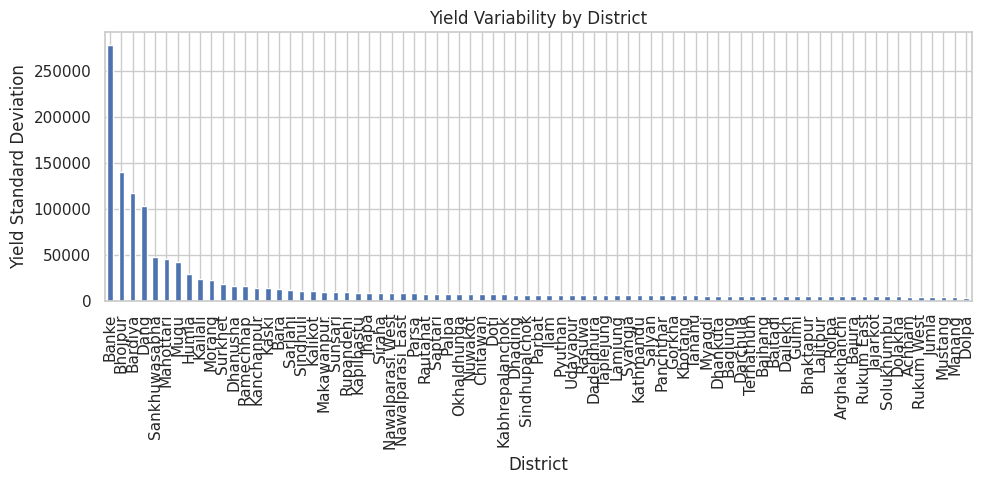

In [120]:

district_var = df1.groupby('District')['Yield'].std().sort_values(ascending=False)
district_var.plot(kind='bar', title='Yield Variability by District', figsize=(10, 5))
plt.ylabel('Yield Standard Deviation')
plt.tight_layout()
plt.show()


In [121]:
from scipy.stats import ttest_ind

group1 = df[df['Season'] == 'Summer']['Precip']
group2 = df[df['Season'] == 'Winter']['Precip']

t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
print(f"P-value: {p_val:.4f}")
if p_val < 0.05:
    print("Significant difference in precipitation between Summer and Winter.")
else:
    print("No significant difference detected.")


P-value: 0.0000
Significant difference in precipitation between Summer and Winter.


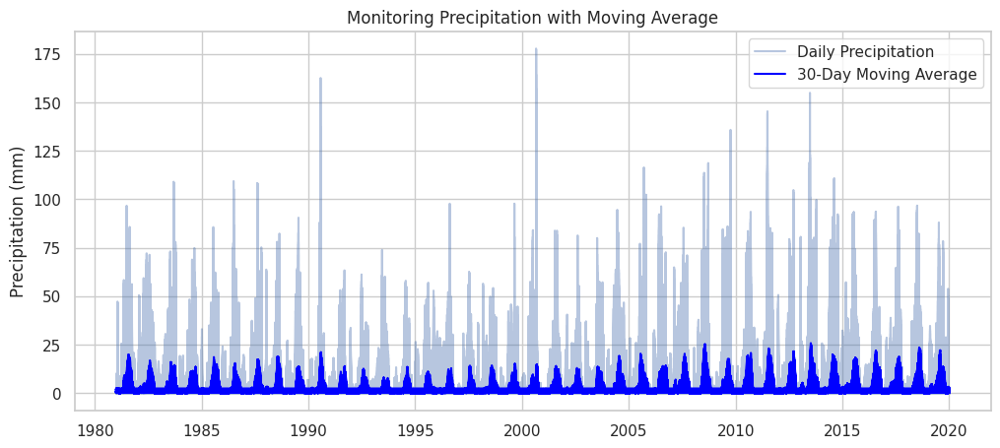

In [122]:
df['Precip_MA'] = df['Precip'].rolling(window=30).mean()

plt.figure(figsize=(12, 5))
plt.plot(df['Precip'], label='Daily Precipitation', alpha=0.4)
plt.plot(df['Precip_MA'], label='30-Day Moving Average', color='blue')
plt.title('Monitoring Precipitation with Moving Average')
plt.ylabel('Precipitation (mm)')
plt.legend()
plt.grid(True)
plt.show()


Records per District:
 District
Arghakhanchi    14244
Baglung         14244
Baitadi         14244
Bajang          14244
Banke           14244
                ...  
Syangja         14244
Tanahun         14244
Taplejung       14244
Terhathum       14244
Udayapur        14244
Name: count, Length: 62, dtype: int64


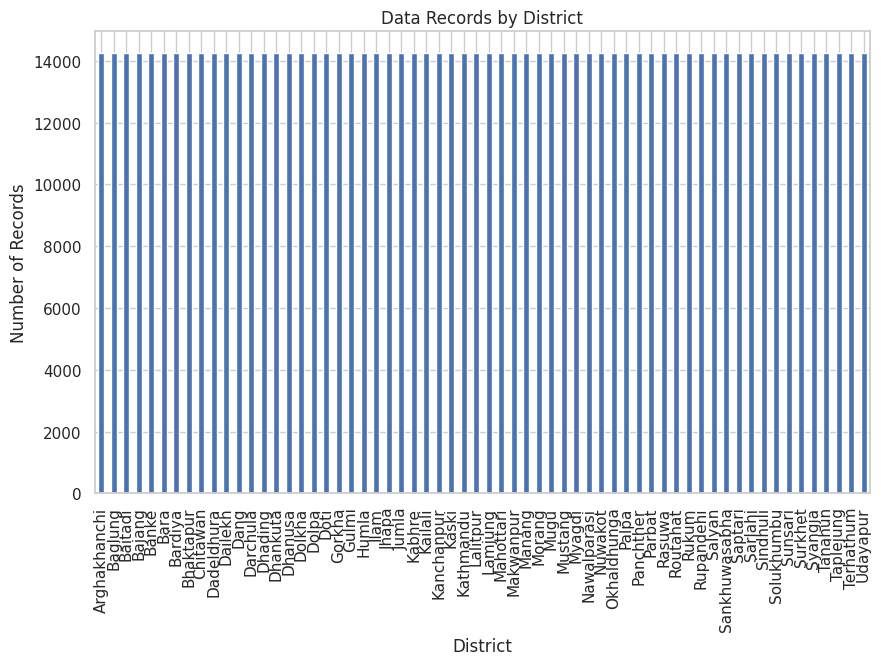

In [123]:

# Count data points by district
district_counts = df['District'].value_counts()

print("Records per District:\n", district_counts)

# Visualize distribution
plt.figure(figsize=(10,6))
district_counts.plot(kind='bar')
plt.title('Data Records by District')
plt.xlabel('District')
plt.ylabel('Number of Records')
plt.show()

# Interpretation:
# Large differences mean sampling bias - some districts are underrepresented.


In [124]:
# Perform the merge
merged_teraidata = pd.merge(terai_data, df1, on=['Year', 'District'], how='inner')


In [125]:
merged_teraidata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4324642 entries, 0 to 4324641
Data columns (total 28 columns):
 #   Column              Dtype  
---  ------              -----  
 0   District            object 
 1   Latitude            float64
 2   Longitude           float64
 3   Precip              float64
 4   Pressure            float64
 5   Humidity_2m         float64
 6   RH_2m               float64
 7   Temp_2m             float64
 8   WetBulbTemp_2m      float64
 9   MaxTemp_2m          float64
 10  MinTemp_2m          float64
 11  EarthSkinTemp       float64
 12  WindSpeed_10m       float64
 13  MaxWindSpeed_10m    float64
 14  MinWindSpeed_10m    float64
 15  WindSpeed_50m       float64
 16  MaxWindSpeed_50m    float64
 17  MinWindSpeed_50m    float64
 18  Year                int32  
 19  Month               int32  
 20  Day                 int32  
 21  Season              object 
 22  Temp_2m_RollingAvg  float64
 23  Crop                object 
 24  Crop Type           obje

In [126]:
columns_to_drop = [
    'Month','Day','Season'
]

# Drop the specified columns
merged_teraidata = merged_teraidata.drop(columns=columns_to_drop)

In [127]:
merged_teraidata.columns

Index(['District', 'Latitude', 'Longitude', 'Precip', 'Pressure',
       'Humidity_2m', 'RH_2m', 'Temp_2m', 'WetBulbTemp_2m', 'MaxTemp_2m',
       'MinTemp_2m', 'EarthSkinTemp', 'WindSpeed_10m', 'MaxWindSpeed_10m',
       'MinWindSpeed_10m', 'WindSpeed_50m', 'MaxWindSpeed_50m',
       'MinWindSpeed_50m', 'Year', 'Temp_2m_RollingAvg', 'Crop', 'Crop Type',
       'Province', 'Production', 'Yield'],
      dtype='object')

In [128]:
unique_crops = merged_teraidata['Crop'].unique()
unique_crops

array(['Oilseed', 'Potato', 'Sugarcane', 'Tobacco', 'Barley', 'Maize',
       'Millet', 'Paddy', 'Wheat', 'Black Gram', 'Chick Pea', 'Grass Pea',
       'Lentil', 'Other Pulses', 'Pigeon Pea', 'Soyabean', 'Mango',
       'Vegetable', 'Banana', 'Guava', 'Jackfruit', 'Litchi', 'Papaya',
       'Pineapple', 'Lime', 'Lemon', 'Sweetorange', 'Chilli', 'Garlic',
       'Ginger', 'Turmeric', 'Apple', 'Horse Gram', 'Cotton', 'Arecanut',
       'Coconut', 'Jute', 'Cardamom'], dtype=object)

In [129]:
unique_dist = merged_teraidata['District'].unique()
unique_dist

array(['Banke', 'Bara', 'Bardiya', 'Dang', 'Jhapa', 'Kailali',
       'Kanchanpur', 'Mahottari', 'Morang', 'Rautahat', 'Rupandehi',
       'Saptari', 'Sarlahi', 'Sunsari'], dtype=object)

In [130]:
district_crop_data = merged_teraidata[['District', 'Crop']].drop_duplicates()
district_crop_data = district_crop_data.sort_values(by='District')


In [131]:
district_crop_data

,District,Crop
0,Banke,Oilseed
67939,Banke,Guava
67940,Banke,Jackfruit
67941,Banke,Litchi
67943,Banke,Papaya
...,...,...
4016011,Sunsari,Lentil
4016012,Sunsari,Other Pulses
4016013,Sunsari,Pigeon Pea
4066045,Sunsari,Mango


In [132]:
grouped_data = district_crop_data.groupby('District')['Crop'].apply(list).reset_index()

# Display the result
print(grouped_data)


      District                                               Crop
0        Banke  [Oilseed, Guava, Jackfruit, Litchi, Papaya, Pi...
1         Bara  [Arecanut, Banana, Coconut, Guava, Jackfruit, ...
2      Bardiya  [Cotton, Banana, Guava, Jackfruit, Litchi, Pap...
3         Dang  [Pineapple, Banana, Guava, Jackfruit, Litchi, ...
4        Jhapa  [Jute, Coconut, Guava, Jackfruit, Litchi, Papa...
5      Kailali  [Cardamom, Guava, Jackfruit, Litchi, Papaya, P...
6   Kanchanpur  [Mango, Vegetable, Banana, Guava, Jackfruit, L...
7    Mahottari  [Litchi, Arecanut, Banana, Coconut, Guava, Jac...
8       Morang  [Papaya, Banana, Coconut, Guava, Jackfruit, Li...
9     Rautahat  [Horse Gram, Arecanut, Banana, Coconut, Guava,...
10   Rupandehi  [Litchi, Arecanut, Banana, Coconut, Guava, Jac...
11     Saptari  [Pineapple, Banana, Coconut, Guava, Jackfruit,...
12     Sarlahi  [Arecanut, Banana, Coconut, Guava, Jackfruit, ...
13     Sunsari  [Litchi, Arecanut, Banana, Coconut, Guava, Jac...


In [134]:
# Filter for sugarcane data in the Terai region
sugarcane_data = merged_teraidata[merged_teraidata['Crop'] == 'Sugarcane']

# Display to verify
sugarcane_data.head()


,District,Latitude,Longitude,Precip,Pressure,Humidity_2m,RH_2m,Temp_2m,WetBulbTemp_2m,MaxTemp_2m,...,WindSpeed_50m,MaxWindSpeed_50m,MinWindSpeed_50m,Year,Temp_2m_RollingAvg,Crop,Crop Type,Province,Production,Yield
2,Banke,28.1,81.7,0.00,92.61,5.05,50.64,12.80,2.67,19.48,...,2.33,4.12,1.13,1981,-5.408667,Sugarcane,Cash Crop,Province 5,10080.0,18000.0
11,Banke,28.1,81.7,0.00,92.69,5.02,49.59,13.06,2.65,19.53,...,1.90,3.12,0.58,1981,-4.761000,Sugarcane,Cash Crop,Province 5,10080.0,18000.0
20,Banke,28.1,81.7,0.48,92.66,5.46,52.73,13.39,3.84,19.44,...,2.10,3.23,0.85,1981,-4.209333,Sugarcane,Cash Crop,Province 5,10080.0,18000.0
29,Banke,28.1,81.7,0.50,92.60,5.91,58.83,12.89,4.91,19.35,...,2.93,4.54,0.74,1981,-3.739000,Sugarcane,Cash Crop,Province 5,10080.0,18000.0
38,Banke,28.1,81.7,1.66,92.59,6.14,61.45,12.82,5.50,18.68,...,2.60,3.63,1.24,1981,-3.271000,Sugarcane,Cash Crop,Province 5,10080.0,18000.0


In [135]:
# Filter for the last 5 years
recent_data = sugarcane_data[sugarcane_data['Year'] >= (sugarcane_data['Year'].max() - 4)]

# Display the filtered dataset
print(recent_data[['Year', 'District', 'Yield']])



         Year District    Yield
235598   2013    Banke  48000.0
235624   2013    Banke  48000.0
235650   2013    Banke  48000.0
235676   2013    Banke  48000.0
235702   2013    Banke  48000.0
...       ...      ...      ...
4324495  2017  Sunsari  60000.0
4324525  2017  Sunsari  60000.0
4324555  2017  Sunsari  60000.0
4324585  2017  Sunsari  60000.0
4324615  2017  Sunsari  60000.0

[24834 rows x 3 columns]


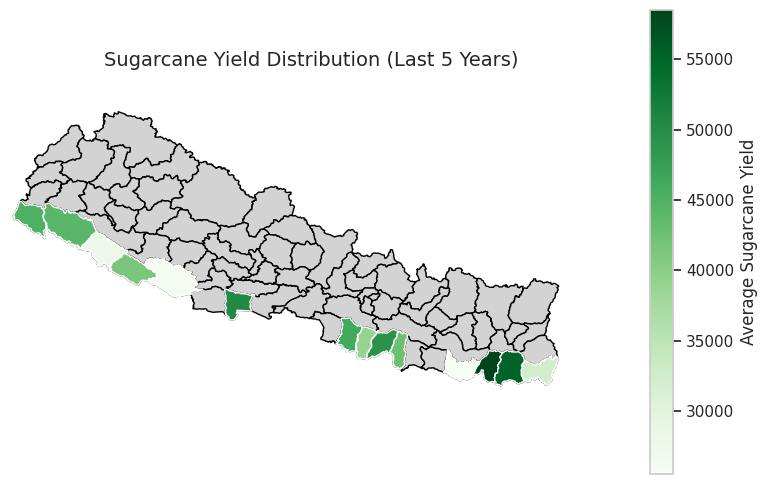

In [136]:
# Get the last 5 years from the dataset
last_5_years = sugarcane_data['Year'].max()  # Get the most recent year
recent_data = sugarcane_data[sugarcane_data['Year'] >= last_5_years - 4]

# Group sugarcane data by district to calculate average yield over the last 5 years
avg_yield = recent_data.groupby('District')['Yield'].mean().reset_index()

# Merge the geographic data with the sugarcane yield
terai_geo = geo_data[geo_data['District'].isin(avg_yield['District'])]
terai_geo = terai_geo.merge(avg_yield, on='District')

# Create the plot
fig, ax = plt.subplots(figsize=(8, 5))

# Base map for reference
geo_data.plot(ax=ax, color='lightgray', edgecolor='black')

# Choropleth map for sugarcane yield
gplt.choropleth(
    terai_geo,
    hue='Yield',
    cmap='Greens',
    legend=False,
    ax=ax
)

# Add color bar
sm = plt.cm.ScalarMappable(cmap='Greens', norm=mpl.colors.Normalize(vmin=terai_geo['Yield'].min(), vmax=terai_geo['Yield'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Average Sugarcane Yield')

# Title and axis limits
plt.title('Sugarcane Yield Distribution (Last 5 Years)', fontsize=14)
ax.set_xlim([80, 89])  # Adjust these values to match your map bounds
ax.set_ylim([26, 31])  # Adjust these values to match your map bounds

plt.tight_layout()
plt.show()


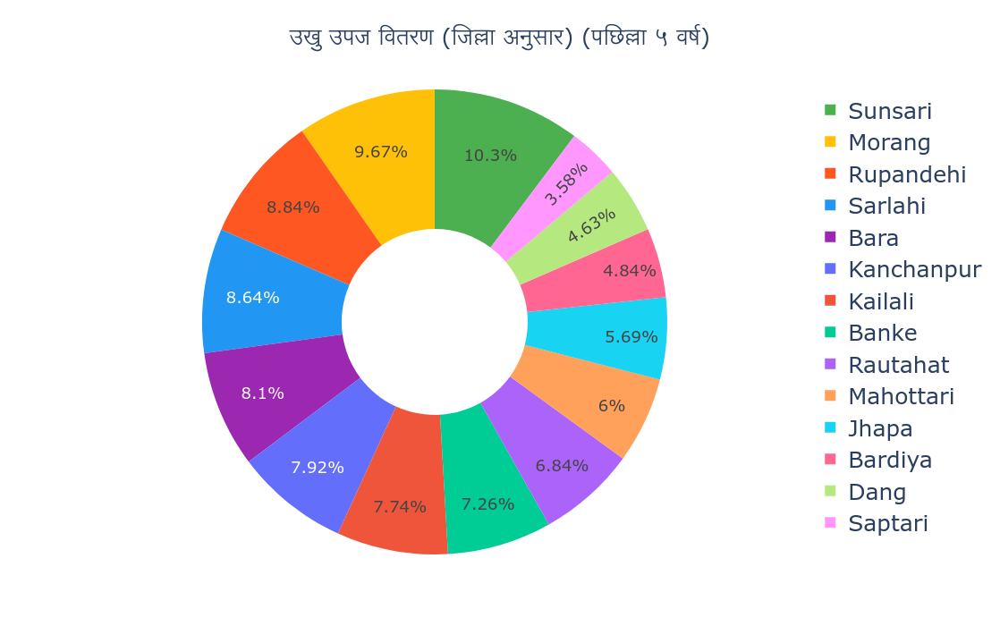

In [137]:
import plotly.graph_objects as go

# Get the last 5 years from the original sugarcane data
last_5_years = sugarcane_data['Year'].max()  # Get the most recent year
recent_data = sugarcane_data[sugarcane_data['Year'] >= last_5_years - 4]  # Filter for the last 5 years

# Group by district and calculate the total sugarcane yield for the last 5 years
district_yield = recent_data.groupby('District')['Yield'].sum()

# Sort the yield data for better visualization
district_yield_sorted = district_yield.sort_values(ascending=False)

# Create the doughnut chart
fig = go.Figure(go.Pie(
    labels=district_yield_sorted.index,
    values=district_yield_sorted,
    hole=0.4,  # Doughnut chart (hole size)
    hoverinfo='label+percent',
    textinfo='percent',
    textfont=dict(size=18),  # Set font size for labels
    marker=dict(colors=['#4CAF50', '#FFC107', '#FF5722', '#2196F3', '#9C27B0']),  # Custom color list
))

# Update layout with Nepali title and font size
fig.update_layout(
    title='उखु उपज वितरण (जिल्ला अनुसार) (पछिल्ला ५ वर्ष)',  # Nepali title
    title_font=dict(size=25),  # Title font size
    title_x=0.5,  # Center the title
    font=dict(size=25),  # Set general font size
    height=700,  # Adjust height for better visualization
    width=800,   # Adjust width for better visualization
)

# Show the chart
fig.show()


/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Glyph 2346 (\N{DEVANAGARI LETTER PA}) missing from font(s) DejaVu Sans.

/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Matplotlib currently does not support Devanagari natively.

/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Glyph 2331 (\N{DEVANAGARI LETTER CHA}) missing from font(s) DejaVu Sans.

/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Glyph 2367 (\N{DEVANAGARI VOWEL SIGN I}) missing from font(s) DejaVu Sans.

/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Glyph 2354 (\N{DEVANAGARI LETTER LA}) missing from font(s) DejaVu Sans.

/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Glyph 2381 (\N{DEVANAGARI SIGN VIRAMA}) missing from font(s) DejaVu Sans.

/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Glyph 2379 (\N{DEVANAGARI VOWEL SIGN O}) missing from font(s) DejaVu Sans.

/tmp/ipykernel_7200/3141506775.py:43: UserWarning:

Glyph 2411 (\N{DEVANAGARI DIGIT FIVE}) missing from font(s) DejaVu Sans.

/tm

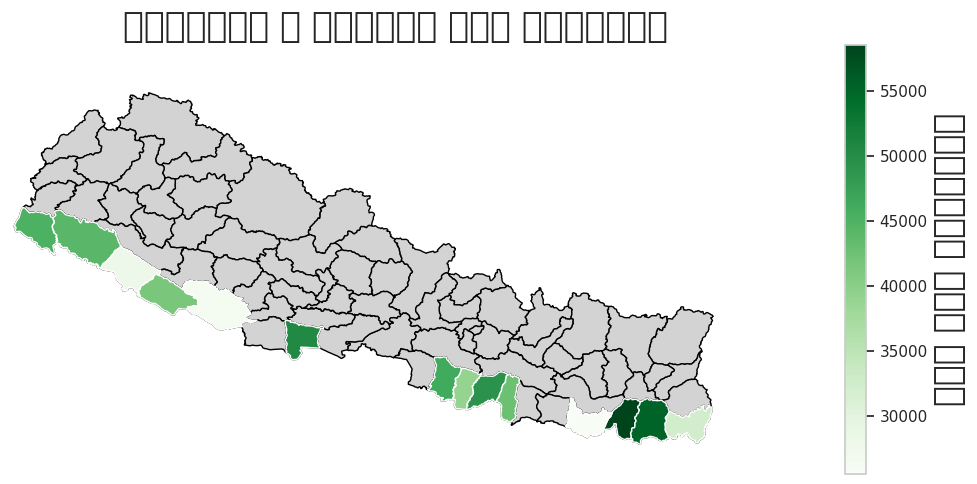

In [138]:
import matplotlib.pyplot as plt
import geopandas as gpd
import geopandas.tools
import matplotlib as mpl

# Get the last 5 years from the dataset
last_5_years = sugarcane_data['Year'].max()  # Get the most recent year
recent_data = sugarcane_data[sugarcane_data['Year'] >= last_5_years - 4]

# Group sugarcane data by district to calculate average yield over the last 5 years
avg_yield = recent_data.groupby('District')['Yield'].mean().reset_index()

# Merge the geographic data with the sugarcane yield
terai_geo = geo_data[geo_data['District'].isin(avg_yield['District'])]
terai_geo = terai_geo.merge(avg_yield, on='District')

# Create the plot
fig, ax = plt.subplots(figsize=(13, 5))

# Base map for reference
geo_data.plot(ax=ax, color='lightgray', edgecolor='black')

# Choropleth map for sugarcane yield
gplt.choropleth(
    terai_geo,
    hue='Yield',
    cmap='Greens',
    legend=False,
    ax=ax
)

# Add color bar
sm = plt.cm.ScalarMappable(cmap='Greens', norm=mpl.colors.Normalize(vmin=terai_geo['Yield'].min(), vmax=terai_geo['Yield'].max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('औसत उखु उत्पादन',fontsize=25)

# Title and axis limits
plt.title('पछिल्लो ५ वर्षको उखु उत्पादन', fontsize=25)
ax.set_xlim([80, 89])  # Adjust these values to match your map bounds
ax.set_ylim([26, 31])  # Adjust these values to match your map bounds

plt.tight_layout()
plt.show()


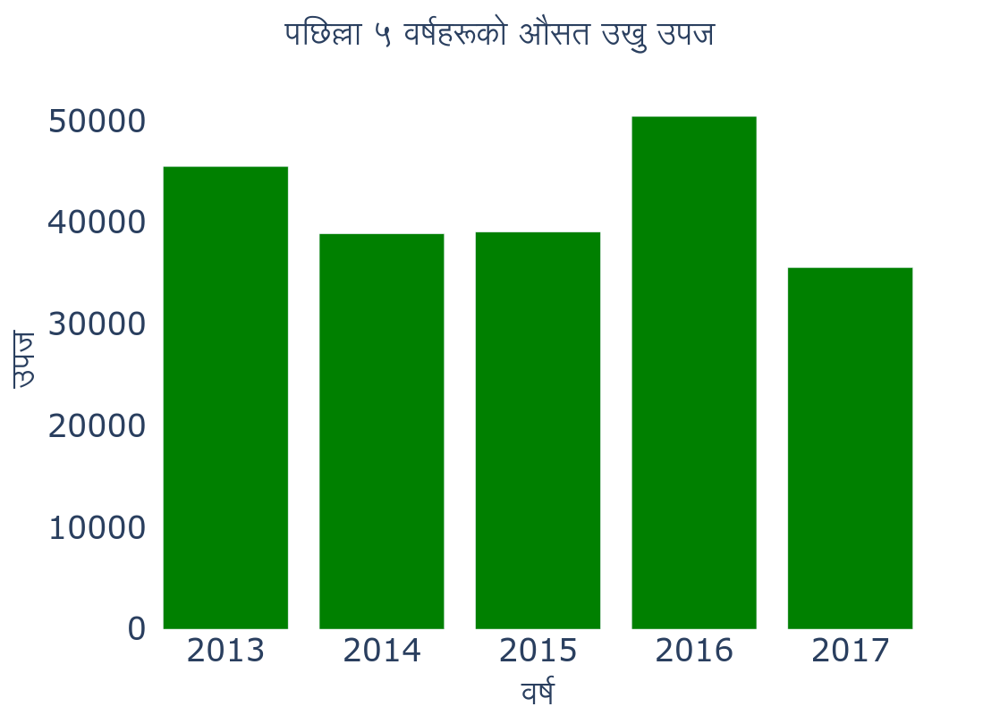

In [139]:
import plotly.graph_objects as go

# Group the data by 'Year' and calculate the average 'Yield'
avg_yield = recent_data.groupby('Year')['Yield'].mean()

# Create the bar plot with Plotly
fig = go.Figure(data=[go.Bar(x=avg_yield.index, y=avg_yield.values, marker_color='green')])

# Update the layout with Nepali titles, labels, a taller layout, and centered title
fig.update_layout(
    title='पछिल्ला ५ वर्षहरूको औसत उखु उपज',  # Nepali title
    title_x=0.5,  # Center the title
    xaxis_title='वर्ष',  # Nepali x-axis label
    yaxis_title='उपज',  # Nepali y-axis label
    title_font=dict(size=35),
    xaxis_title_font=dict(size=35),  # Increased size for x-axis label
    yaxis_title_font=dict(size=35),  # Increased size for y-axis label
    height=800,  # Increase the height to make the graph taller
    width=1000,   # Decrease the width to make the graph more vertical
    yaxis=dict(
        tickformat="d",  # Show full numbers (without 'K')
        tickfont=dict(size=35)  # Increase size of y-axis ticks
    ),
    xaxis=dict(
        tickfont=dict(size=35)  # Increase size of x-axis ticks
    ),
    plot_bgcolor='white',  # Set plot background color to white
    paper_bgcolor='white'  # Set the overall background color to white
)

# Show the plot
fig.show()


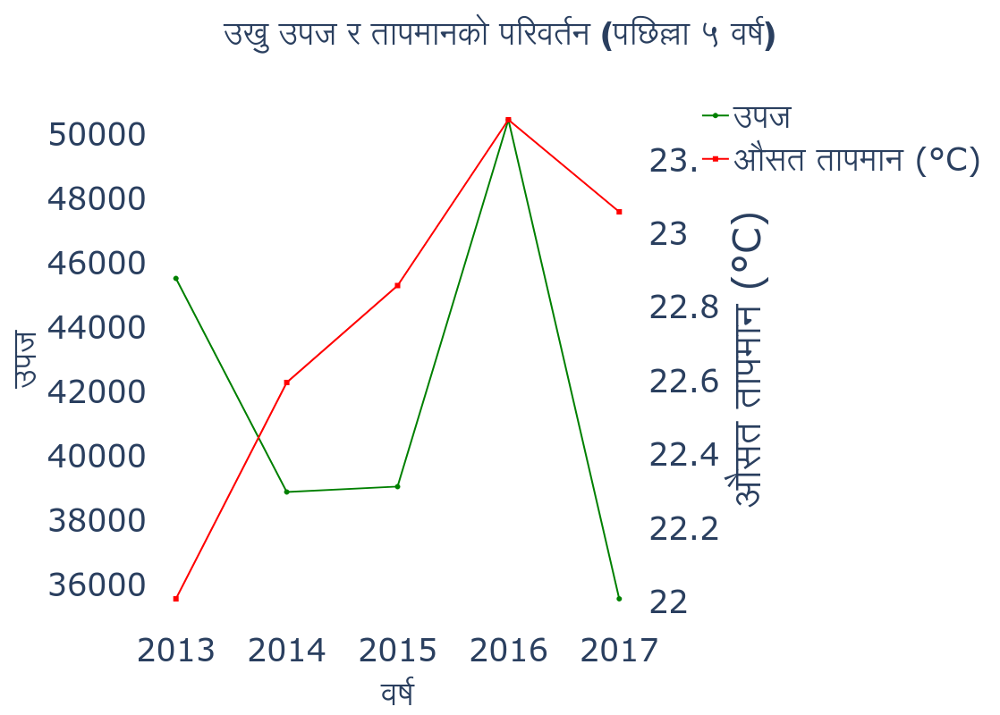

In [140]:
import plotly.graph_objects as go

# Group data by year and calculate average yield and temperature
yearly_data = recent_data.groupby('Year').agg({'Yield': 'mean', 'Temp_2m': 'mean'})

# Create figure
fig = go.Figure()

# Add Yield trend (green line)
fig.add_trace(go.Scatter(
    x=yearly_data.index, 
    y=yearly_data['Yield'], 
    mode='lines+markers', 
    name='उपज ',  # Nepali label for yield
    line=dict(color='green'),
    marker=dict(symbol='circle')
))

# Add Temperature trend (red line)
fig.add_trace(go.Scatter(
    x=yearly_data.index, 
    y=yearly_data['Temp_2m'], 
    mode='lines+markers', 
    name='औसत तापमान (°C)',  # Nepali label for temperature
    line=dict(color='red'),
    marker=dict(symbol='square'),
    yaxis='y2'  # This makes this trace use the second y-axis
))

# Update layout with dual y-axes, title centered, bold titles, and white background
fig.update_layout(
    title='उखु उपज र तापमानको परिवर्तन (पछिल्ला ५ वर्ष)',  # Nepali title
    title_font=dict(size=35, family='Arial Black'),  # Use a bold font like Arial Black
    title_x=0.5,  # Center the title
    xaxis_title='वर्ष',  # Nepali x-axis label
    xaxis_title_font=dict(size=35, family='Arial Black'),  # Make x-axis title bold using Arial Black
    yaxis_title='उपज ',  # Nepali y-axis label for yield
    yaxis_title_font=dict(size=35, family='Arial Black'),  # Make y-axis title bold using Arial Black
    yaxis=dict(
        title='उपज ',  # Nepali label for yield
        tickformat="d",  # Show full numbers
        showgrid=False,  # Disable grid on y-axis
        tickfont=dict(size=35)  # Set font size for y-axis ticks
    ),
    yaxis2=dict(
        title='औसत तापमान (°C)',  # Nepali label for temperature
        overlaying='y',  # Overlay on the same plot
        side='right',  # Place the second y-axis on the right
        showgrid=False,  # Disable grid on second y-axis
        tickfont=dict(size=35)  # Set font size for second y-axis ticks
    ),
    height=800,  # Increase height for better visibility
    width=1000,   # Adjust width to make the plot more vertical
    xaxis=dict(
        tickvals=yearly_data.index,  # Set tick marks at the years
        ticktext=[str(year) for year in yearly_data.index],  # Display the years as text
        showgrid=False,  # Disable grid on x-axis
        tickfont=dict(size=35)  # Set font size for x-axis ticks
    ),
    font=dict(size=35),  # Set font size for the overall plot
    legend=dict(
        x=1.1,  # Shift the legend slightly to the right
        y=1,  # Keep it at the top
        xanchor='left',  # Anchor the legend box from the left
        font=dict(size=35)  # Adjust font size for the legend
    ),
    plot_bgcolor='white',  # Set plot background color to white
    paper_bgcolor='white'  # Set the overall background color to white
)

# Show the plot
fig.show()


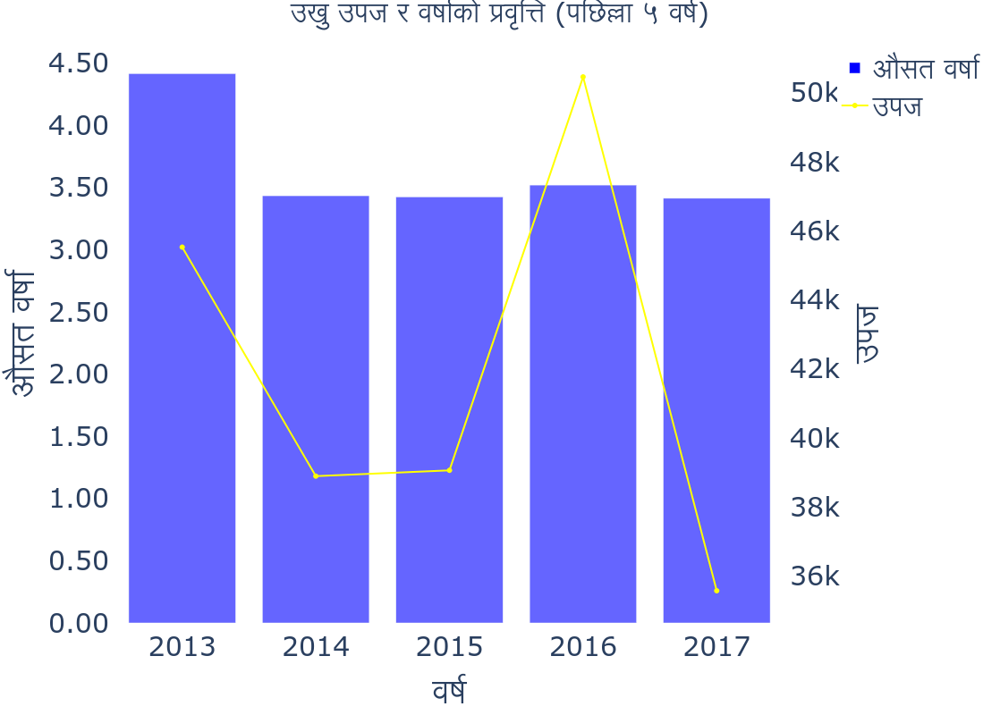

In [141]:
import plotly.graph_objects as go

# Get the last 5 years from the original sugarcane data
last_5_years = sugarcane_data['Year'].max()  # Get the most recent year
recent_data = sugarcane_data[sugarcane_data['Year'] >= last_5_years - 4]  # Filter for the last 5 years

# Group data by year
yearly_data = recent_data.groupby('Year').agg({'Yield': 'mean', 'Precip': 'mean'}).reset_index()

# Create figure
fig = go.Figure()

# Add Precipitation bar plot (blue)
fig.add_trace(go.Bar(
    x=yearly_data['Year'],
    y=yearly_data['Precip'],
    name='औसत वर्षा',  # Nepali label for precipitation
    marker=dict(color='blue', opacity=0.6),
    yaxis='y1'  # Use the first y-axis for precipitation
))

# Add Yield line plot (green)
fig.add_trace(go.Scatter(
    x=yearly_data['Year'],
    y=yearly_data['Yield'],
    name='उपज',  # Nepali label for yield
    mode='lines+markers',
    line=dict(color='yellow', width=2),
    marker=dict(symbol='circle'),
    yaxis='y2'  # Use the second y-axis for yield
))

# Update layout for dual y-axes, Nepali labels, and shifted legend
fig.update_layout(
    title='उखु उपज र वर्षाको प्रवृत्ति (पछिल्ला ५ वर्ष)',  # Nepali title
    title_font=dict(size=30),
    title_x=0.5,  # Center the title
    xaxis=dict(
        title='वर्ष',  # Nepali x-axis label
        title_standoff=20,  # Space between axis and title
        showline=True,  # Show the axis line
    ),
    yaxis=dict(
        title='औसत वर्षा',  # Nepali label for precipitation
        tickformat=".2f",  # Show two decimal places for precipitation
        showgrid=True,
        zeroline=True,
        tickprefix="",
        showline=True
    ),
    yaxis2=dict(
        title='उपज',  # Nepali label for yield
        overlaying='y',  # Overlay on the same plot
        side='right',  # Place the second y-axis on the right
        showgrid=False,
        showline=True
    ),
    legend=dict(
        x=1.08,  # Shift legend to the right
        y=1,  # Keep it at the top
        xanchor='left',  # Anchor the legend box from the left
        font=dict(size=30)  # Adjust font size
    ),
    margin=dict(l=100, r=50, t=50, b=100),  # Adjust margins
    height=800,  # Adjust height for better visibility
    width=1000,  # Adjust width
    font=dict(size=30),  # Set font size
    plot_bgcolor='white',  # Set plot background color to white
    paper_bgcolor='white'  # Set the overall background color to white
)

# Show the plot
fig.show()


In [142]:
X = terai_data.drop(columns=['Temp_2m'])  # Drop the target column to get the features
y = terai_data['Temp_2m']  # The target variable is 'Temp_2m'

In [143]:
X = pd.get_dummies(X, columns=['District', 'Season'], drop_first=True)


In [144]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [145]:
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)

In [146]:
rf_regressor.fit(X_train, y_train)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [147]:
y_pred = rf_regressor.predict(X_test)

In [148]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("mse:",mse)
print("r2:",r2)

mse: 0.035071767652488116
r2: 0.9990066845361657


In [149]:
feature_importances = rf_regressor.feature_importances_


In [150]:
features = X.columns  # The feature names
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})


In [151]:
importance_df = importance_df.sort_values(by='Importance', ascending=False)

In [152]:
importance_df.head(10)

,Feature,Importance
9,EarthSkinTemp,0.984017
7,MaxTemp_2m,0.007879
8,MinTemp_2m,0.005761
3,Pressure,0.000446
13,WindSpeed_50m,0.000317
14,MaxWindSpeed_50m,0.000243
19,Temp_2m_RollingAvg,0.000203
11,MaxWindSpeed_10m,0.000111
2,Precip,0.000111
17,Month,0.000108


In [153]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
scaler.fit(X)  # where X is your training features


# Assuming X, y, and rf_regressor are defined
# Use the most recent data row to start creating future data
recent_data = X.iloc[-1, :].copy()

# Create an empty list to hold the predictions for the next 5 years
future_predictions = []

# Generate data for the next 5 years
for year in range(2020, 2025):
    # Create new rows for the next years by copying and adjusting the year
    future_data = recent_data.copy()
    future_data['Year'] = year
    future_data['Month'] = 1
    future_data['Day'] = 1
    
    # Append the future row to the list
    future_predictions.append(future_data)

# Convert to DataFrame
future_df = pd.DataFrame(future_predictions)

# Ensure future_df columns match the original feature set
future_df = future_df[X.columns]

# Apply the same preprocessing (scaling) as was done to the training data
future_df_scaled = scaler.transform(future_df)  # Use transform, not fit_transform

# Convert back to DataFrame with the same column names
future_df_scaled = pd.DataFrame(future_df_scaled, columns=X.columns)

# Use the trained model to predict Temp_2m for the future data
future_temp_pred = rf_regressor.predict(future_df_scaled)

# Output the predictions for the next 5 years
predictions = pd.DataFrame({
    'Year': range(2020, 2025),
    'Predicted_Temperature': future_temp_pred
})

print(predictions)


   Year  Predicted_Temperature
0  2020                 5.4386
1  2021                 5.4386
2  2022                 5.4386
3  2023                 5.4386
4  2024                 5.4386


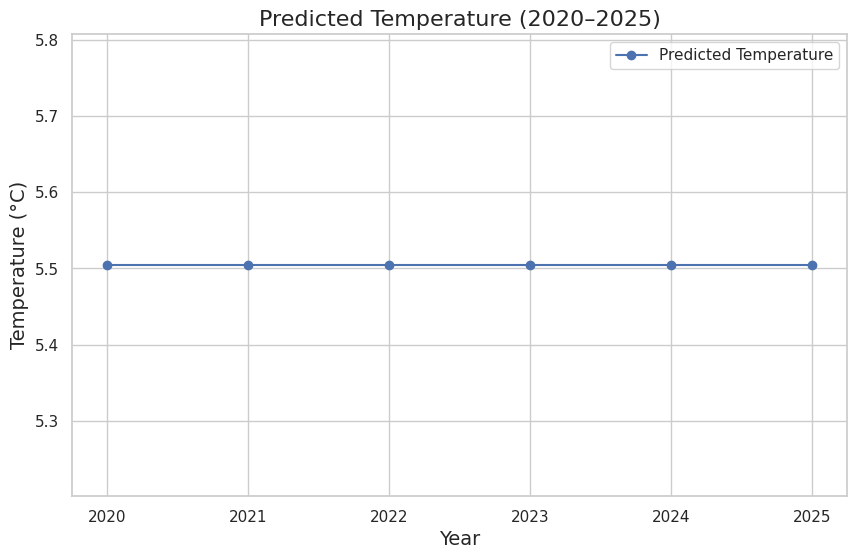

In [154]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Generate future years (2020–2025)
future_years = list(range(2020, 2026))

# Step 2: Use mean feature values from training data
avg_features = X_train.mean()  # Replace this with domain-specific values if available

# Create a DataFrame for future predictions
future_df = pd.DataFrame({
    'Year': future_years,
    'Precip': avg_features['Precip'],
    'Humidity': avg_features['Humidity_2m'],
    'Pressure': avg_features['Pressure'],
    'WetBulbTemp_2m': avg_features['WetBulbTemp_2m'],
    'WindSpeed_10m': avg_features['WindSpeed_10m'],
    # Add other necessary features and ensure consistency with the model
})

# Align columns and one-hot encode if necessary
future_df = pd.get_dummies(future_df, drop_first=True)
missing_cols = set(X_train.columns) - set(future_df.columns)
for col in missing_cols:
    future_df[col] = 0
future_df = future_df[X_train.columns]

# Step 3: Predict future temperatures
future_df['Predicted_Temp_2m'] = rf_regressor.predict(future_df)

# Step 4: Plot the results
plt.figure(figsize=(10, 6))
plt.plot(future_df['Year'], future_df['Predicted_Temp_2m'], marker='o', label='Predicted Temperature')
plt.title('Predicted Temperature (2020–2025)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Temperature (°C)', fontsize=14)
plt.grid(True)
plt.legend()
plt.show()


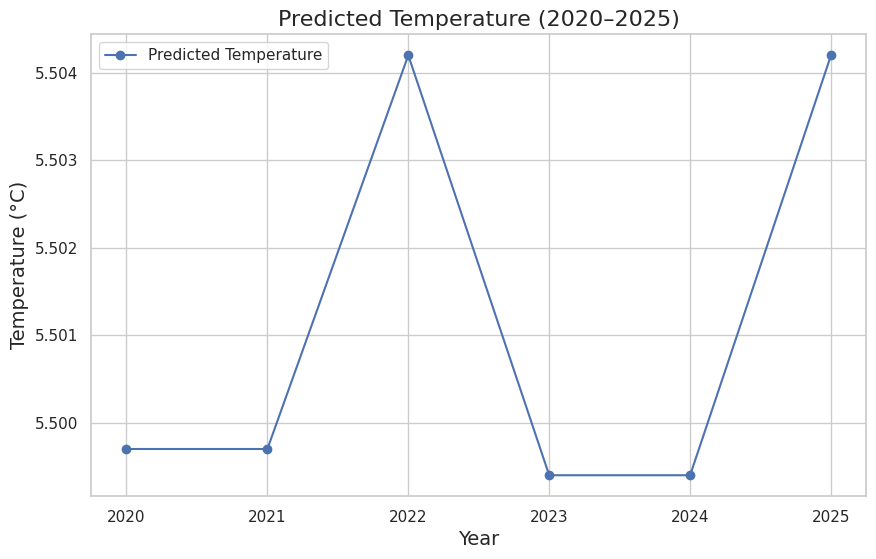

In [155]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Generate future years (2020–2025)
future_years = list(range(2020, 2026))

# Step 2: Add a trend or variation to features
avg_features = X_train.mean()

# Create a DataFrame for future predictions
future_df = pd.DataFrame({
    'Year': future_years,
    'Precip': avg_features['Precip'] + np.linspace(-0.2, 0.2, len(future_years)),  # Example trend
    'Humidity': avg_features['Humidity_2m'] + np.random.uniform(-1, 1, len(future_years)),  # Random fluctuation
    'Pressure': avg_features['Pressure'] + np.random.uniform(-0.5, 0.5, len(future_years)),  # Random fluctuation
    'WetBulbTemp_2m': avg_features['WetBulbTemp_2m'] + np.linspace(-0.1, 0.1, len(future_years)),  # Example trend
    'WindSpeed_10m': avg_features['WindSpeed_10m'] + np.random.uniform(-0.2, 0.2, len(future_years)),  # Random fluctuation
    
})

# Align columns and one-hot encode if necessary
future_df = pd.get_dummies(future_df, drop_first=True)
missing_cols = set(X_train.columns) - set(future_df.columns)
for col in missing_cols:
    future_df[col] = 0
future_df = future_df[X_train.columns]

# Step 3: Predict future temperatures
future_df['Predicted_Temp_2m'] = rf_regressor.predict(future_df)

# Step 4: Plot the results
plt.figure(figsize=(10, 6))
plt.plot(future_df['Year'], future_df['Predicted_Temp_2m'], marker='o', label='Predicted Temperature')
plt.title('Predicted Temperature (2020–2025)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Temperature (°C)', fontsize=14)
plt.grid(True)
plt.legend()
plt.show()


In [156]:
# Linear Regression
# Handle missing values (if any)
terai_data = terai_data.dropna()

# Select features (X) and target (y)
X = terai_data[['Humidity_2m', 'Precip', 'WindSpeed_10m']]  # Replace with relevant columns
y = terai_data['Temp_2m']


In [157]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [158]:
# Initialize and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Print model coefficients
print("Coefficients:", model.coef_)
print("Intercept:", model.intercept_)


Coefficients: [ 0.61424972 -0.10263786  2.49981211]
Intercept: 10.77278996595082


In [159]:
# Predict on the test set
y_pred = model.predict(X_test)


Mean Squared Error: 19.840751123095977
R-squared: 0.4380629713352888


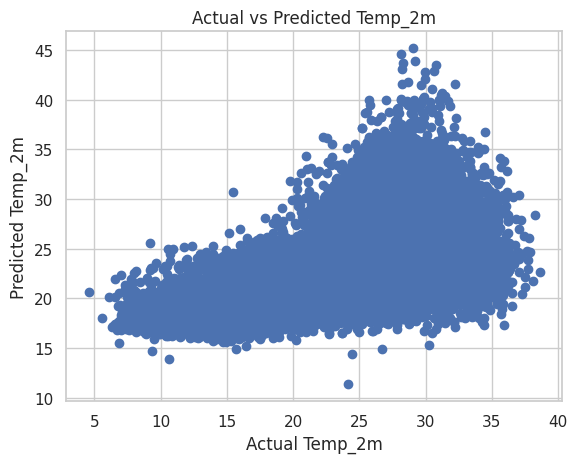

In [160]:
# Calculate metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

# Visualize actual vs predicted values
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Temp_2m")
plt.ylabel("Predicted Temp_2m")
plt.title("Actual vs Predicted Temp_2m")
plt.show()


In [161]:
# Feature (X) and target (y)
X = terai_data[['Year']]
y = terai_data['Temp_2m']

# Train the linear regression model
model = LinearRegression()
model.fit(X, y)

# Print model parameters
print("Slope:", model.coef_[0])
print("Intercept:", model.intercept_)


Slope: -0.003909836701661803
Intercept: 30.68826922075757


In [162]:
# Years for prediction (2020–2024)
future_years = pd.DataFrame({'Year': np.arange(2020, 2025)})

# Predict temperatures
future_temps = model.predict(future_years)

# Create a dataframe for future predictions
future_data = pd.DataFrame({'Year': future_years['Year'], 'Temp_2m': future_temps})

# Combine with the original data
combined_data = pd.concat([terai_data, future_data], ignore_index=True)

print(combined_data)


       District  Latitude  Longitude  Precip  Pressure  Humidity_2m  RH_2m  \
0         Banke      28.1       81.7    0.00     92.61         5.05  50.64   
1         Banke      28.1       81.7    0.00     92.69         5.02  49.59   
2         Banke      28.1       81.7    0.48     92.66         5.46  52.73   
3         Banke      28.1       81.7    0.50     92.60         5.91  58.83   
4         Banke      28.1       81.7    1.66     92.59         6.14  61.45   
...         ...       ...        ...     ...       ...          ...    ...   
242148      NaN       NaN        NaN     NaN       NaN          NaN    NaN   
242149      NaN       NaN        NaN     NaN       NaN          NaN    NaN   
242150      NaN       NaN        NaN     NaN       NaN          NaN    NaN   
242151      NaN       NaN        NaN     NaN       NaN          NaN    NaN   
242152      NaN       NaN        NaN     NaN       NaN          NaN    NaN   

          Temp_2m  WetBulbTemp_2m  MaxTemp_2m  ...  MaxWindSpee

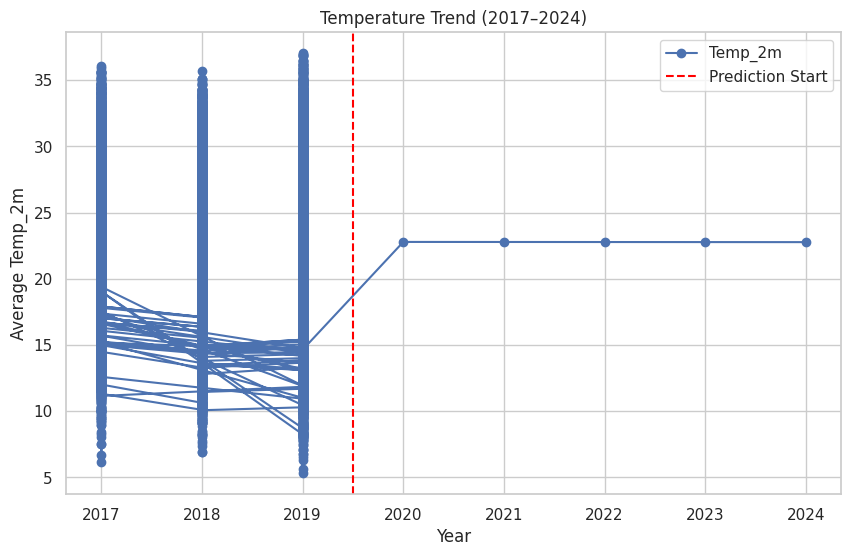

In [163]:
# Filter for plotting range (2017–2024)
plot_data = combined_data[combined_data['Year'] >= 2017]

# Plot
plt.figure(figsize=(10, 6))
plt.plot(plot_data['Year'], plot_data['Temp_2m'], marker='o', label='Temp_2m')
plt.axvline(x=2019.5, color='red', linestyle='--', label='Prediction Start')
plt.xlabel('Year')
plt.ylabel('Average Temp_2m')
plt.title('Temperature Trend (2017–2024)')
plt.legend()
plt.grid(True)
plt.show()
